In [1]:
import numpy as np
import pandas as pd
from datetime import datetime
import yfinance as yf
import ta
import getpass
import scipy.stats
import seaborn as sns
from scipy.optimize import minimize
import matplotlib.pyplot as plt
from pandas_datareader import DataReader

import warnings
warnings.filterwarnings("ignore")

C:\Users\slaks\anaconda3\lib\site-packages\yfinance\base.py:48: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  _empty_series = pd.Series()


# Section 5 
## Model 1 GARCH 

[*********************100%%**********************]  1 of 1 completed
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


         Current function value: nan
         Iterations: 1
         Function evaluations: 560
         Gradient evaluations: 112


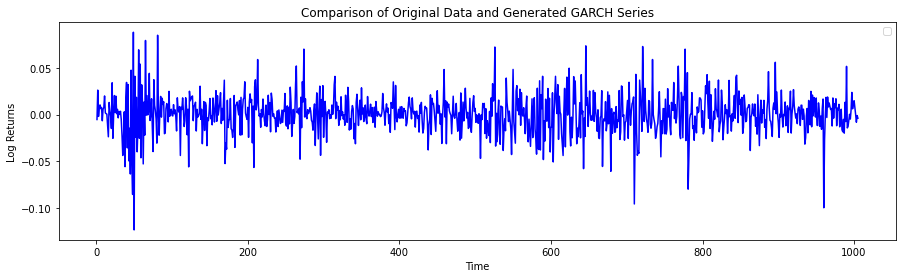

RMSE values is: nan


In [2]:
def GARCH(param, *args):
    mu = param[0]
    omega = param[1]
    alpha = param[2]
    beta = param[3]
    T = Y.shape[0]
    GARCH_Dens = np.zeros(T)
    sigma2 = np.zeros(T)
    F = np.zeros(T)
    v = np.zeros(T)
    for t in range(1, T):
        sigma2[t] = omega + alpha * ((Y[t - 1] - mu) ** 2) + beta * (sigma2[t - 1])
        F[t] = Y[t] - mu - np.sqrt(sigma2[t]) * np.random.normal(0, 1, 1)
        v[t] = sigma2[t]
        GARCH_Dens[t] = (
            (1 / 2) * np.log(2 * np.pi)
            + (1 / 2) * np.log(v[t])
            + (1 / 2) * (F[t] / v[t])
        )
        Likelihood = np.sum(GARCH_Dens[1:-1])
        return Likelihood


def GARCH_PROD(params, Y0, T):
    mu = params[0]
    omega = params[1]
    alpha = params[2]
    beta = params[3]
    Y = np.zeros(T)
    sigma2 = np.zeros(T)
    Y[0] = Y0
    sigma2[0] = 0.003
    for t in range(1, T):
        sigma2[t] = omega + alpha * ((Y[t - 1] - mu) ** 2) + beta * (sigma2[t - 1])
        Y[t] = mu + np.sqrt(sigma2[t]) * np.random.normal(0, 1, 1)
    return Y


start_date = datetime(2020, 1, 1)
end_date = datetime(2023, 12, 31)
GOOGL = yf.download("GOOGL", start_date, end_date)
Y = np.diff(np.log(GOOGL["Adj Close"].values))
T = Y.size
param0 = np.array([np.mean(Y), np.var(Y) / 4, 0.15, 0.2])
param_star = minimize(
    GARCH, param0, method="BFGS", options={"xtol": 1e-8, "disp": True}
)
Y_GARCH = GARCH_PROD(param_star.x, Y[0], T)
timevec = np.linspace(1, T, T)
plt.figure(figsize=(15, 4))
plt.plot(timevec, Y_GARCH, "r", timevec, Y, "b")
RMSE = np.sqrt(np.mean((Y_GARCH - Y) ** 2))

plt.xlabel("Time")
plt.ylabel("Log Returns")
plt.title("Comparison of Original Data and Generated GARCH Series")
plt.legend()
plt.show()
print("RMSE values is:", RMSE)

# Kalman Filter Model

## Model 2 Kalman 

[*********************100%%**********************]  1 of 1 completed


         Current function value: 2199.439581
         Iterations: 52
         Function evaluations: 476
         Gradient evaluations: 93
RMSE values is: $ 2.828979505064633


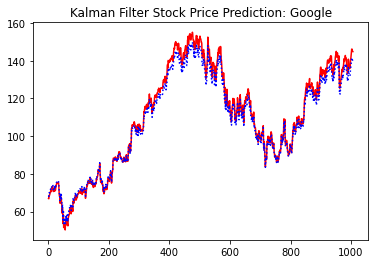

In [3]:
# Kalman Filter
def kalman_filter(param,*args):
    # initialize params
    Z = param[0]
    T = param[1]
    H = param[2]
    Q = param[3]
    # initialize vector values:
    u_predict,  u_update,  P_predict, P_update, v, F = {},{},{},{},{},{}
    u_update[0] = Y[0]
    u_predict[0] = u_update[0]
    P_update[0] = np.var(Y)/4
    P_predict[0] =  T*P_update[0]*np.transpose(T)+Q
    Likelihood = 0
    for s in range(1, S):
        F[s] = Z*P_predict[s-1]*np.transpose(Z)+H
        v[s]= Y[s-1]-Z*u_predict[s-1]
        u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
        u_predict[s] = T*u_update[s]
        P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
        P_predict[s] = T*P_update[s]*np.transpose(T)+Q
        Likelihood += (1/2)*np.log(2*np.pi)+(1/2)*np.log(abs(F[s]))+(1/2)*np.transpose(v[s])*(1/F[s])*v[s]

    return Likelihood


def kalman_smoother(params, *args):
    # initialize params
    Z = params[0]
    T = params[1]
    H = params[2]
    Q = params[3]
    # initialize vector values:
    u_predict,  u_update,  P_predict, P_update, v, F = {},{},{},{},{},{}
    u_update[0] = Y[0]
    u_predict[0] = u_update[0]
    P_update[0] = np.var(Y)/4
    P_predict[0] =  T*P_update[0]*np.transpose(T)+Q
    for s in range(1, S):
        F[s] = Z*P_predict[s-1]*np.transpose(Z)+H
        v[s]=Y[s-1]-Z*u_predict[s-1]
        u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
        u_predict[s] = T*u_update[s]
        P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
        P_predict[s] = T*P_update[s]*np.transpose(T)+Q

    u_smooth, P_smooth = {}, {}
    u_smooth[S-1] = u_update[S-1]
    P_smooth[S-1] = P_update[S-1]
    for t in range(S-1, 0, -1):
        u_smooth[t-1] = u_update[t] + P_update[t]*np.transpose(T)/P_predict[t]*(u_smooth[t]-T*u_update[s])
        P_smooth[t-1] = P_update[t] + P_update[t]*np.transpose(T)/P_predict[t]*(P_smooth[t]-P_predict[t])/P_predict[t]*T*P_update[t]

    # del u_update[-1]
    smooth_path = u_smooth
    return smooth_path


start_date = datetime(2020, 1, 1)
end_date = datetime(2023, 12, 31)
stock = yf.download("GOOGL",start_date ,end_date)
Y = stock['Adj Close'].values
S = Y.shape[0]

# param0 = np.array([np.mean(Y), np.std(Y)/2500, 0.05, 0.33])
param0 = np.array([0.95,0.95,np.std(Y)/50, np.std(Y)/50])

results = minimize(kalman_filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})

# smoothe and visualize the estimated path
param_star = results.x
path = kalman_smoother(param_star, Y, S)
Y_kalmanFilter = np.hstack(list(path.values()))
Y_kalmanFilter = Y_kalmanFilter[::-1]

timevec = np.linspace(1,S,S)
plt.title('Kalman Filter Stock Price Prediction: Google')
plt.plot(timevec, Y_kalmanFilter,'r',timevec, Y,'b:')

RMSE = np.sqrt(np.mean((Y_kalmanFilter - Y)**2))
print('RMSE values is: $', RMSE)


In [4]:
# Define dataset start and end date => Two years worth of data
start_date = datetime(2020, 1, 1)
end_date = datetime(2023, 12, 31)

# Downloaded data
GOOGL_STOCK = yf.download("GOOGL", start_date, end_date)
GOOGL_STOCK.describe()

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
count,1006.000000,1006.000000,1006.000000,1006.000000,1006.000000,1.006000e+03
mean,107.802233,109.088274,106.595380,107.870246,107.870246,3.449913e+07
std,25.168280,25.275266,24.983858,25.114855,25.114855,1.501427e+07
min,52.818501,53.345501,50.443501,52.706501,52.706501,9.312000e+06
25%,88.102499,88.856625,86.948874,88.028498,88.028498,2.502685e+07
50%,109.788750,111.436501,107.970001,109.888500,109.888500,3.071800e+07
75%,130.753246,132.082123,128.990002,130.250000,130.250000,3.933900e+07
max,151.250000,151.546494,148.899002,149.838501,149.838501,1.232000e+08


# Exracting external factors using Fred API

In [5]:
from fredapi import Fred
key = "919412489c102d1ee9a114c2987bd4ee"
fred = Fred(api_key=key)

In [6]:
feat_list = ['T10Y3M', 'OBMMIJUMBO30YF',  # term premium 10yr-3mon, 30 yr mortgage jumbo loan
           'DEXUSEU', 'DEXJPUS', 'DEXUSUK', # spot exchange rates to EUR, JPY, GBP 
           'CBBTCUSD', 'CBETHUSD',  # cryptocurrencies
               'T10YIE', 'DCOILBRENTEU', # breakeven inflation + brent oil price 
               'VIXCLS', # implied volatilities
               'DAAA', 'DBAA', # corporate bond yield
               'NIKKEI225', 'AMERIBOR', 'T10YIE', 'T5YIE', 'BAMLH0A0HYM2','BAMLH0A0HYM2EY', 
                              'DGS10', 'DGS1', 'DCOILWTICO', 
                              'DHHNGSP', 'USRECD', 'USRECDM', 'USRECDP', 'SP500'] # JPN stock mkt index

feat_df = pd.DataFrame()
print(start_date)
print(end_date)
for feat in feat_list:
    feature = fred.get_series(feat, start_date, end_date)
    feature = feature.to_frame(feat)
    feat_df = pd.concat([feat_df, feature], axis=1)
feat_df.dropna(inplace=True)

print(feat_df)

2020-01-01 00:00:00
2023-12-31 00:00:00
            T10Y3M  OBMMIJUMBO30YF  DEXUSEU  DEXJPUS  DEXUSUK  CBBTCUSD  \
2020-01-06    0.25           3.944   1.1187   108.36   1.3163   7773.48   
2020-01-07    0.29           4.012   1.1138   108.53   1.3127   8169.95   
2020-01-08    0.33           3.889   1.1117   109.03   1.3110   8035.08   
2020-01-09    0.31           4.054   1.1106   109.47   1.3069   7813.78   
2020-01-10    0.29           3.927   1.1119   109.50   1.3060   8183.89   
...            ...             ...      ...      ...      ...       ...   
2023-12-21   -1.53           6.892   1.0990   142.16   1.2668  43876.98   
2023-12-22   -1.54           6.869   1.1008   142.60   1.2720  44015.60   
2023-12-27   -1.65           7.048   1.1114   142.05   1.2797  43444.45   
2023-12-28   -1.61           6.866   1.1073   141.08   1.2743  42613.04   
2023-12-29   -1.52           6.514   1.1062   140.92   1.2743  42056.30   

            CBETHUSD  T10YIE  DCOILBRENTEU  VIXCLS  ...  BA

In [7]:
combined = pd.concat([GOOGL_STOCK, feat_df], axis=1)
print(combined.isnull().sum())

Open               0
High               0
Low                0
Close              0
Adj Close          0
Volume             0
T10Y3M            92
OBMMIJUMBO30YF    92
DEXUSEU           92
DEXJPUS           92
DEXUSUK           92
CBBTCUSD          92
CBETHUSD          92
T10YIE            92
DCOILBRENTEU      92
VIXCLS            92
DAAA              92
DBAA              92
NIKKEI225         92
AMERIBOR          92
T10YIE            92
T5YIE             92
BAMLH0A0HYM2      92
BAMLH0A0HYM2EY    92
DGS10             92
DGS1              92
DCOILWTICO        92
DHHNGSP           92
USRECD            92
USRECDM           92
USRECDP           92
SP500             92
dtype: int64


In [8]:
GOOGL_STOCK = pd.concat([GOOGL_STOCK, feat_df], axis=1)
GOOGL_STOCK.fillna(method='bfill', inplace=True)
GOOGL_STOCK

,Open,High,Low,Close,Adj Close,Volume,T10Y3M,OBMMIJUMBO30YF,DEXUSEU,DEXJPUS,...,BAMLH0A0HYM2,BAMLH0A0HYM2EY,DGS10,DGS1,DCOILWTICO,DHHNGSP,USRECD,USRECDM,USRECDP,SP500
2020-01-02,67.420502,68.433998,67.324501,68.433998,68.433998,27278000,0.25,3.944,1.1187,108.36,...,3.57,5.23,1.81,1.54,63.27,2.10,0.0,0.0,0.0,3246.28
2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000,0.25,3.944,1.1187,108.36,...,3.57,5.23,1.81,1.54,63.27,2.10,0.0,0.0,0.0,3246.28
2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000,0.25,3.944,1.1187,108.36,...,3.57,5.23,1.81,1.54,63.27,2.10,0.0,0.0,0.0,3246.28
2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000,0.29,4.012,1.1138,108.53,...,3.54,5.21,1.83,1.53,62.70,2.17,0.0,0.0,0.0,3237.18
2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000,0.33,3.889,1.1117,109.03,...,3.50,5.22,1.87,1.55,59.65,2.09,0.0,0.0,0.0,3253.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,140.770004,141.990005,140.710007,141.490005,141.490005,26514600,-1.54,6.869,1.1008,142.60,...,3.39,7.40,3.90,4.82,73.29,2.54,0.0,0.0,0.0,4754.63
2023-12-26,141.589996,142.679993,141.190002,141.520004,141.520004,16780300,-1.65,7.048,1.1114,142.05,...,3.34,7.27,3.79,4.79,74.31,2.63,0.0,0.0,0.0,4781.58
2023-12-27,141.589996,142.080002,139.889999,140.369995,140.369995,19628600,-1.65,7.048,1.1114,142.05,...,3.34,7.27,3.79,4.79,74.31,2.63,0.0,0.0,0.0,4781.58
2023-12-28,140.779999,141.139999,139.750000,140.229996,140.229996,16045700,-1.61,6.866,1.1073,141.08,...,3.32,7.30,3.84,4.82,72.02,2.55,0.0,0.0,0.0,4783.35


# Fama-French 5 Factors Indicators

In [9]:
df_fama = pd.read_csv("F-F_Research_Data_5_Factors_2x3_daily.CSV", skiprows=3)
df_fama = df_fama.iloc[:-1]
df_fama.rename(columns={"Unnamed: 0": "Date"}, inplace=True)
df_fama['Date'] = pd.to_datetime(df_fama['Date'], format='%Y%m%d')
df_fama = df_fama[(df_fama["Date"] >= start_date) & (df_fama["Date"] <= end_date)]
fama = df_fama.set_index("Date")

In [10]:
fama.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1006 entries, 2020-01-02 to 2023-12-29
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Mkt-RF  1006 non-null   float64
 1   SMB     1006 non-null   float64
 2   HML     1006 non-null   float64
 3   RMW     1006 non-null   float64
 4   CMA     1006 non-null   float64
 5   RF      1006 non-null   float64
dtypes: float64(6)
memory usage: 55.0 KB


In [11]:
fama

,Mkt-RF,SMB,HML,RMW,CMA,RF
Date,,,,,,
2020-01-02,0.86,-0.97,-0.34,0.24,-0.22,0.006
2020-01-03,-0.67,0.30,0.00,-0.14,-0.10,0.006
2020-01-06,0.36,-0.20,-0.55,-0.17,-0.26,0.006
2020-01-07,-0.19,-0.03,-0.25,-0.12,-0.25,0.006
2020-01-08,0.47,-0.17,-0.64,-0.19,-0.17,0.006
...,...,...,...,...,...,...
2023-12-22,0.21,0.61,0.09,-0.64,0.19,0.021
2023-12-26,0.48,0.81,0.46,-0.34,-0.15,0.021
2023-12-27,0.16,0.16,0.12,-0.31,-0.14,0.021


In [12]:
GOOGL_STOCK = pd.concat([GOOGL_STOCK, fama], axis=1)
GOOGL_STOCK.fillna(method='bfill', inplace=True)
GOOGL_STOCK

,Open,High,Low,Close,Adj Close,Volume,T10Y3M,OBMMIJUMBO30YF,DEXUSEU,DEXJPUS,...,USRECD,USRECDM,USRECDP,SP500,Mkt-RF,SMB,HML,RMW,CMA,RF
2020-01-02,67.420502,68.433998,67.324501,68.433998,68.433998,27278000,0.25,3.944,1.1187,108.36,...,0.0,0.0,0.0,3246.28,0.86,-0.97,-0.34,0.24,-0.22,0.006
2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000,0.25,3.944,1.1187,108.36,...,0.0,0.0,0.0,3246.28,-0.67,0.30,0.00,-0.14,-0.10,0.006
2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000,0.25,3.944,1.1187,108.36,...,0.0,0.0,0.0,3246.28,0.36,-0.20,-0.55,-0.17,-0.26,0.006
2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000,0.29,4.012,1.1138,108.53,...,0.0,0.0,0.0,3237.18,-0.19,-0.03,-0.25,-0.12,-0.25,0.006
2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000,0.33,3.889,1.1117,109.03,...,0.0,0.0,0.0,3253.05,0.47,-0.17,-0.64,-0.19,-0.17,0.006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,140.770004,141.990005,140.710007,141.490005,141.490005,26514600,-1.54,6.869,1.1008,142.60,...,0.0,0.0,0.0,4754.63,0.21,0.61,0.09,-0.64,0.19,0.021
2023-12-26,141.589996,142.679993,141.190002,141.520004,141.520004,16780300,-1.65,7.048,1.1114,142.05,...,0.0,0.0,0.0,4781.58,0.48,0.81,0.46,-0.34,-0.15,0.021
2023-12-27,141.589996,142.080002,139.889999,140.369995,140.369995,19628600,-1.65,7.048,1.1114,142.05,...,0.0,0.0,0.0,4781.58,0.16,0.16,0.12,-0.31,-0.14,0.021
2023-12-28,140.779999,141.139999,139.750000,140.229996,140.229996,16045700,-1.61,6.866,1.1073,141.08,...,0.0,0.0,0.0,4783.35,-0.01,-0.38,0.03,-0.32,0.15,0.021


# ADS features

In [13]:
ads = pd.read_excel("ADS_Index_Most_Current_Vintage.xlsx")
ads.rename(columns={"Unnamed: 0": "Date"}, inplace=True)
ads["Date"] = pd.to_datetime(ads["Date"], format="%Y:%m:%d")
ads = ads[(ads["Date"] >= start_date) & (ads["Date"] <= end_date)]
ads = ads.set_index("Date")
ads

,ADS_Index
Date,
2020-01-01,-0.349588
2020-01-02,-0.335847
2020-01-03,-0.322218
2020-01-04,-0.308695
2020-01-05,-0.295274
...,...
2023-12-27,-0.105282
2023-12-28,-0.123216
2023-12-29,-0.142383


In [14]:
ads.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1461 entries, 2020-01-01 to 2023-12-31
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ADS_Index  1461 non-null   float64
dtypes: float64(1)
memory usage: 22.8 KB


In [15]:
GOOGL_STOCK = pd.concat([GOOGL_STOCK, ads], axis=1)
GOOGL_STOCK.dropna(inplace=True)
GOOGL_STOCK

,Open,High,Low,Close,Adj Close,Volume,T10Y3M,OBMMIJUMBO30YF,DEXUSEU,DEXJPUS,...,USRECDM,USRECDP,SP500,Mkt-RF,SMB,HML,RMW,CMA,RF,ADS_Index
2020-01-02,67.420502,68.433998,67.324501,68.433998,68.433998,27278000.0,0.25,3.944,1.1187,108.36,...,0.0,0.0,3246.28,0.86,-0.97,-0.34,0.24,-0.22,0.006,-0.335847
2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000.0,0.25,3.944,1.1187,108.36,...,0.0,0.0,3246.28,-0.67,0.30,0.00,-0.14,-0.10,0.006,-0.322218
2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000.0,0.25,3.944,1.1187,108.36,...,0.0,0.0,3246.28,0.36,-0.20,-0.55,-0.17,-0.26,0.006,-0.282218
2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000.0,0.29,4.012,1.1138,108.53,...,0.0,0.0,3237.18,-0.19,-0.03,-0.25,-0.12,-0.25,0.006,-0.269522
2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000.0,0.33,3.889,1.1117,109.03,...,0.0,0.0,3253.05,0.47,-0.17,-0.64,-0.19,-0.17,0.006,-0.257180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,140.770004,141.990005,140.710007,141.490005,141.490005,26514600.0,-1.54,6.869,1.1008,142.60,...,0.0,0.0,4754.63,0.21,0.61,0.09,-0.64,0.19,0.021,-0.032926
2023-12-26,141.589996,142.679993,141.190002,141.520004,141.520004,16780300.0,-1.65,7.048,1.1114,142.05,...,0.0,0.0,4781.58,0.48,0.81,0.46,-0.34,-0.15,0.021,-0.088573
2023-12-27,141.589996,142.080002,139.889999,140.369995,140.369995,19628600.0,-1.65,7.048,1.1114,142.05,...,0.0,0.0,4781.58,0.16,0.16,0.12,-0.31,-0.14,0.021,-0.105282
2023-12-28,140.779999,141.139999,139.750000,140.229996,140.229996,16045700.0,-1.61,6.866,1.1073,141.08,...,0.0,0.0,4783.35,-0.01,-0.38,0.03,-0.32,0.15,0.021,-0.123216


In [16]:
GOOGL_STOCK.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'T10Y3M',
       'OBMMIJUMBO30YF', 'DEXUSEU', 'DEXJPUS', 'DEXUSUK', 'CBBTCUSD',
       'CBETHUSD', 'T10YIE', 'DCOILBRENTEU', 'VIXCLS', 'DAAA', 'DBAA',
       'NIKKEI225', 'AMERIBOR', 'T10YIE', 'T5YIE', 'BAMLH0A0HYM2',
       'BAMLH0A0HYM2EY', 'DGS10', 'DGS1', 'DCOILWTICO', 'DHHNGSP', 'USRECD',
       'USRECDM', 'USRECDP', 'SP500', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
       'RF', 'ADS_Index'],
      dtype='object')

In [17]:
GOOGL_STOCK.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1006 entries, 2020-01-02 to 2023-12-29
Data columns (total 39 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Open            1006 non-null   float64
 1   High            1006 non-null   float64
 2   Low             1006 non-null   float64
 3   Close           1006 non-null   float64
 4   Adj Close       1006 non-null   float64
 5   Volume          1006 non-null   float64
 6   T10Y3M          1006 non-null   float64
 7   OBMMIJUMBO30YF  1006 non-null   float64
 8   DEXUSEU         1006 non-null   float64
 9   DEXJPUS         1006 non-null   float64
 10  DEXUSUK         1006 non-null   float64
 11  CBBTCUSD        1006 non-null   float64
 12  CBETHUSD        1006 non-null   float64
 13  T10YIE          1006 non-null   float64
 14  DCOILBRENTEU    1006 non-null   float64
 15  VIXCLS          1006 non-null   float64
 16  DAAA            1006 non-null   float64
 17  DBAA           

# Section 2 Feature engineering

## 1. Log transformations

### A list of columns from the dataset that might benefit from log transformations:

* 'Volume': Trading volumes can vary significantly from day to day and are often right-skewed.
* 'CBBTCUSD' and 'CBETHUSD': Cryptocurrency prices/values can be highly volatile and skewed.
* 'DGS10', 'DGS1': Interest rates, while usually constrained, can vary in a manner that might benefit from normalization, especially when comparing across different time periods.
* 'DCOILBRENTEU', 'DCOILWTICO': Oil prices can vary widely, especially during periods of geopolitical tension or economic instability.
* 'NIKKEI225', 'SP500': Stock market indices can be right-skewed, particularly over long periods that include bull markets.

In [18]:
# List of columns to transform
columns_to_transform = ['Volume', 'CBBTCUSD', 'CBETHUSD', 'DGS10', 'DGS1', 'DCOILBRENTEU', 'DCOILWTICO', 'NIKKEI225', 'SP500']

# Applying log transformation
for column in columns_to_transform:
    GOOGL_STOCK[f'Log_{column}'] = np.log1p(GOOGL_STOCK[column])

GOOGL_STOCK

,Open,High,Low,Close,Adj Close,Volume,T10Y3M,OBMMIJUMBO30YF,DEXUSEU,DEXJPUS,...,ADS_Index,Log_Volume,Log_CBBTCUSD,Log_CBETHUSD,Log_DGS10,Log_DGS1,Log_DCOILBRENTEU,Log_DCOILWTICO,Log_NIKKEI225,Log_SP500
2020-01-02,67.420502,68.433998,67.324501,68.433998,68.433998,27278000.0,0.25,3.944,1.1187,108.36,...,-0.335847,17.121591,8.958602,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573
2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000.0,0.25,3.944,1.1187,108.36,...,-0.322218,16.968588,8.958602,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573
2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000.0,0.25,3.944,1.1187,108.36,...,-0.282218,17.660710,8.958602,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573
2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000.0,0.29,4.012,1.1138,108.53,...,-0.269522,17.351530,9.008340,4.970716,1.040277,0.928219,4.244774,4.154185,10.068015,8.082767
2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000.0,0.33,3.889,1.1117,109.03,...,-0.257180,17.379790,8.991697,4.952582,1.054312,0.936093,4.224056,4.105120,10.052156,8.087656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,140.770004,141.990005,140.710007,141.490005,141.490005,26514600.0,-1.54,6.869,1.1008,142.60,...,-0.032926,17.093206,10.692322,7.752778,1.589235,1.761300,4.397285,4.307976,10.409403,8.467084
2023-12-26,141.589996,142.679993,141.190002,141.520004,141.520004,16780300.0,-1.65,7.048,1.1114,142.05,...,-0.088573,16.635716,10.679261,7.775645,1.566530,1.756132,4.406353,4.321613,10.424726,8.472735
2023-12-27,141.589996,142.080002,139.889999,140.369995,140.369995,19628600.0,-1.65,7.048,1.1114,142.05,...,-0.105282,16.792498,10.679261,7.775645,1.566530,1.756132,4.406353,4.321613,10.424726,8.472735
2023-12-28,140.779999,141.139999,139.750000,140.229996,140.229996,16045700.0,-1.61,6.866,1.1073,141.08,...,-0.123216,16.590952,10.659939,7.761490,1.576915,1.761300,4.382527,4.290733,10.420513,8.473105


## 2. Differencing, Percentage Changes and log Differencing

In [19]:
# First Differences
GOOGL_STOCK['Daily_Returns'] = GOOGL_STOCK['Close'].diff()

# Percentage Changes
GOOGL_STOCK['Pct_Change_Close'] = GOOGL_STOCK['Close'].pct_change() * 100
GOOGL_STOCK.head()

,Open,High,Low,Close,Adj Close,Volume,T10Y3M,OBMMIJUMBO30YF,DEXUSEU,DEXJPUS,...,Log_CBBTCUSD,Log_CBETHUSD,Log_DGS10,Log_DGS1,Log_DCOILBRENTEU,Log_DCOILWTICO,Log_NIKKEI225,Log_SP500,Daily_Returns,Pct_Change_Close
2020-01-02,67.420502,68.433998,67.324501,68.433998,68.433998,27278000.0,0.25,3.944,1.1187,108.36,...,8.958602,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573,NaN,NaN
2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000.0,0.25,3.944,1.1187,108.36,...,8.958602,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573,-0.358002,-0.523134
2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000.0,0.25,3.944,1.1187,108.36,...,8.958602,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573,1.814507,2.665413
2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000.0,0.29,4.012,1.1138,108.53,...,9.008340,4.970716,1.040277,0.928219,4.244774,4.154185,10.068015,8.082767,-0.135002,-0.193162
2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000.0,0.33,3.889,1.1117,109.03,...,8.991697,4.952582,1.054312,0.936093,4.224056,4.105120,10.052156,8.087656,0.496498,0.711769


In [20]:
# Log return
GOOGL_STOCK["Log_Daily_Returns"] = np.log(GOOGL_STOCK["Adj Close"]) - np.log(GOOGL_STOCK["Adj Close"].shift(1))
GOOGL_STOCK = GOOGL_STOCK.dropna()
GOOGL_STOCK

,Open,High,Low,Close,Adj Close,Volume,T10Y3M,OBMMIJUMBO30YF,DEXUSEU,DEXJPUS,...,Log_CBETHUSD,Log_DGS10,Log_DGS1,Log_DCOILBRENTEU,Log_DCOILWTICO,Log_NIKKEI225,Log_SP500,Daily_Returns,Pct_Change_Close,Log_Daily_Returns
2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000.0,0.25,3.944,1.1187,108.36,...,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573,-0.358002,-0.523134,-0.005245
2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000.0,0.25,3.944,1.1187,108.36,...,4.978663,1.033184,0.932164,4.266195,4.163093,10.052160,8.085573,1.814507,2.665413,0.026305
2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000.0,0.29,4.012,1.1138,108.53,...,4.970716,1.040277,0.928219,4.244774,4.154185,10.068015,8.082767,-0.135002,-0.193162,-0.001933
2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000.0,0.33,3.889,1.1117,109.03,...,4.952582,1.054312,0.936093,4.224056,4.105120,10.052156,8.087656,0.496498,0.711769,0.007092
2020-01-09,71.096497,71.433998,70.510498,70.989502,70.989502,33200000.0,0.31,4.054,1.1106,109.47,...,4.932602,1.047319,0.932164,4.213312,4.103635,10.074953,8.094287,0.737503,1.049797,0.010443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,140.770004,141.990005,140.710007,141.490005,141.490005,26514600.0,-1.54,6.869,1.1008,142.60,...,7.752778,1.589235,1.761300,4.397285,4.307976,10.409403,8.467084,1.070007,0.762005,0.007591
2023-12-26,141.589996,142.679993,141.190002,141.520004,141.520004,16780300.0,-1.65,7.048,1.1114,142.05,...,7.775645,1.566530,1.756132,4.406353,4.321613,10.424726,8.472735,0.029999,0.021202,0.000212
2023-12-27,141.589996,142.080002,139.889999,140.369995,140.369995,19628600.0,-1.65,7.048,1.1114,142.05,...,7.775645,1.566530,1.756132,4.406353,4.321613,10.424726,8.472735,-1.150009,-0.812612,-0.008159
2023-12-28,140.779999,141.139999,139.750000,140.229996,140.229996,16045700.0,-1.61,6.866,1.1073,141.08,...,7.761490,1.576915,1.761300,4.382527,4.290733,10.420513,8.473105,-0.139999,-0.099736,-0.000998


## 3. Interaction Terms

### Potential pairs for which interaction terms could be insightful

* Market Volatility and Market Indices: The effect of market volatility (e.g., 'VIXCLS') on Google's stock returns might depend on the broader market's performance (e.g., 'SP500').
* Interest Rates and Economic Indicators: The impact of interest rates (e.g., 'DGS10' for 10-year Treasury yields) on stock returns might vary at different levels of economic health or stress, indicated by metrics like the ADS Index or GDP growth rates (if available).
* Cryptocurrency Prices and Technology Index: The relationship between cryptocurrency prices (e.g., 'CBBTCUSD' for Bitcoin) and Google's stock returns might be influenced by the performance of the technology sector or specific technology indices ('SP500').
* Oil Prices and Global Economic Indicators: The effect of oil prices (e.g., 'DCOILBRENTEU' for Brent crude oil) on Google's stock might change depending on global economic conditions, which could be represented by global economic indicators or commodity prices ('SP500').

In [21]:
# 1. Market Volatility and S&P 500 Index
GOOGL_STOCK.loc[:, 'VIX_SP500'] = GOOGL_STOCK['VIXCLS'] * GOOGL_STOCK['SP500']

# 2. Interest Rates and Economic Indicators (ADS Index as a placeholder for economic health)
GOOGL_STOCK.loc[:, 'DGS10_ADS'] = GOOGL_STOCK['DGS10'] * GOOGL_STOCK['ADS_Index']

# 3. Cryptocurrency Prices and Technology Index (assuming a tech index or using SP500 as a proxy)
GOOGL_STOCK.loc[:, 'BTC_SP500'] = GOOGL_STOCK['CBBTCUSD'] * GOOGL_STOCK['SP500']

# 4. Oil Prices and Global Economic Indicators (using DCOILBRENTEU and SP500 as a proxy for global economy)
GOOGL_STOCK.loc[:, 'OIL_SP500'] = GOOGL_STOCK['DCOILBRENTEU'] * GOOGL_STOCK['SP500']

GOOGL_STOCK

,Open,High,Low,Close,Adj Close,Volume,T10Y3M,OBMMIJUMBO30YF,DEXUSEU,DEXJPUS,...,Log_DCOILWTICO,Log_NIKKEI225,Log_SP500,Daily_Returns,Pct_Change_Close,Log_Daily_Returns,VIX_SP500,DGS10_ADS,BTC_SP500,OIL_SP500
2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000.0,0.25,3.944,1.1187,108.36,...,4.163093,10.052160,8.085573,-0.358002,-0.523134,-0.005245,44960.9780,-0.583215,2.523489e+07,228051.1700
2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000.0,0.25,3.944,1.1187,108.36,...,4.163093,10.052160,8.085573,1.814507,2.665413,0.026305,44960.9780,-0.510815,2.523489e+07,228051.1700
2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000.0,0.29,4.012,1.1138,108.53,...,4.154185,10.068015,8.082767,-0.135002,-0.193162,-0.001933,44640.7122,-0.493225,2.644760e+07,222523.7532
2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000.0,0.33,3.889,1.1117,109.03,...,4.105120,10.052156,8.087656,0.496498,0.711769,0.007092,43753.5225,-0.480927,2.613852e+07,218962.7955
2020-01-09,71.096497,71.433998,70.510498,70.989502,70.989502,33200000.0,0.31,4.054,1.1106,109.47,...,4.103635,10.074953,8.094287,0.737503,1.049797,0.010443,41064.7380,-0.453600,2.558779e+07,218029.5260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,140.770004,141.990005,140.710007,141.490005,141.490005,26514600.0,-1.54,6.869,1.1008,142.60,...,4.307976,10.409403,8.467084,1.070007,0.762005,0.007591,61952.8289,-0.128411,2.092779e+08,381463.9649
2023-12-26,141.589996,142.679993,141.190002,141.520004,141.520004,16780300.0,-1.65,7.048,1.1114,142.05,...,4.321613,10.424726,8.472735,0.029999,0.021202,0.000212,59435.0394,-0.335691,2.077331e+08,387164.5326
2023-12-27,141.589996,142.080002,139.889999,140.369995,140.369995,19628600.0,-1.65,7.048,1.1114,142.05,...,4.321613,10.424726,8.472735,-1.150009,-0.812612,-0.008159,59435.0394,-0.399019,2.077331e+08,387164.5326
2023-12-28,140.779999,141.139999,139.750000,140.229996,140.229996,16045700.0,-1.61,6.866,1.1073,141.08,...,4.290733,10.420513,8.473105,-0.139999,-0.099736,-0.000998,59648.3745,-0.473149,2.038331e+08,378075.9840


In [22]:
GOOGL_STOCK.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'T10Y3M',
       'OBMMIJUMBO30YF', 'DEXUSEU', 'DEXJPUS', 'DEXUSUK', 'CBBTCUSD',
       'CBETHUSD', 'T10YIE', 'DCOILBRENTEU', 'VIXCLS', 'DAAA', 'DBAA',
       'NIKKEI225', 'AMERIBOR', 'T10YIE', 'T5YIE', 'BAMLH0A0HYM2',
       'BAMLH0A0HYM2EY', 'DGS10', 'DGS1', 'DCOILWTICO', 'DHHNGSP', 'USRECD',
       'USRECDM', 'USRECDP', 'SP500', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
       'RF', 'ADS_Index', 'Log_Volume', 'Log_CBBTCUSD', 'Log_CBETHUSD',
       'Log_DGS10', 'Log_DGS1', 'Log_DCOILBRENTEU', 'Log_DCOILWTICO',
       'Log_NIKKEI225', 'Log_SP500', 'Daily_Returns', 'Pct_Change_Close',
       'Log_Daily_Returns', 'VIX_SP500', 'DGS10_ADS', 'BTC_SP500',
       'OIL_SP500'],
      dtype='object')

# Candidate models

In [23]:
import statsmodels.api as sm
from statsmodels.api import OLS, add_constant
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.ar_model import AutoReg
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Capital Asset Pricing Model (CAPM)

In [24]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

df = GOOGL_STOCK

# Load or ensure your DataFrame, GOOGL_STOCK, is ready and the 'SP500' and 'RF' columns are properly aligned
df['Market_Risk_Premium'] = df['SP500'].pct_change() - df['RF'].shift()

# Predicting 'Adj Close' so you need to ensure no NaN values in the relevant columns
data_to_use = df[['Log_Daily_Returns', 'Market_Risk_Premium', 'RF']].dropna()

# Check for and handle infinities
data_to_use.replace([np.inf, -np.inf], np.nan, inplace=True)
data_to_use.dropna(inplace=True)

# Ensure data_to_use indices are aligned and sorted if time series
data_to_use.sort_index(inplace=True)

# Set up X and y for regression
X = sm.add_constant(data_to_use['Market_Risk_Premium'])  # adding a constant for the intercept
y = data_to_use['Log_Daily_Returns']

# Running the OLS model
model = sm.OLS(y, X).fit()

# Predictions
predictions = model.predict(X)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y, predictions))
print("Root Mean Squared Error:", rmse)

# Print the summary of the regression
print(model.summary())


Root Mean Squared Error: 0.016505129668282006
                            OLS Regression Results                            
Dep. Variable:      Log_Daily_Returns   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.391
Method:                 Least Squares   F-statistic:                     643.6
Date:                Thu, 18 Apr 2024   Prob (F-statistic):          4.82e-110
Time:                        18:44:31   Log-Likelihood:                 2693.2
No. Observations:                1003   AIC:                            -5382.
Df Residuals:                    1001   BIC:                            -5373.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

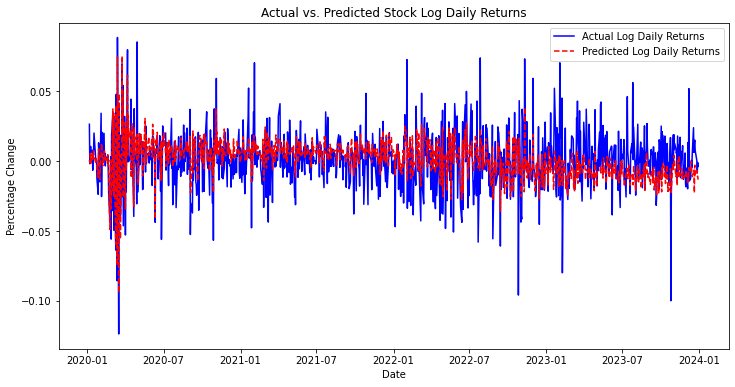

In [25]:
# Plotting the actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(data_to_use.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(data_to_use.index, predictions, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Actual vs. Predicted Stock Log Daily Returns')
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.legend()
plt.show()

# Fama-French 3 Factor Model

In [26]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

df = GOOGL_STOCK

# Clean the data for any NaN or infinite values
df = df.dropna(subset=['Log_Daily_Returns', 'Mkt-RF', 'SMB', 'HML', 'RF'])

# Replace infinite values if any
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Define independent variables (factors) and dependent variable
X = df[['Mkt-RF', 'SMB', 'HML']]
y = df['Log_Daily_Returns']

# Add a constant to the model (the intercept term)
X = sm.add_constant(X)

# Create and fit the OLS model
model = sm.OLS(y, X).fit()

# Make predictions
predictions = model.predict(X)

# Calculate the RMSE
rmse = np.sqrt(mean_squared_error(y, predictions))
print("Root Mean Squared Error:", rmse)

# Print the summary of the regression
print(model.summary())

Root Mean Squared Error: 0.012559940916907455
                            OLS Regression Results                            
Dep. Variable:      Log_Daily_Returns   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     611.8
Date:                Thu, 18 Apr 2024   Prob (F-statistic):          1.23e-225
Time:                        18:44:31   Log-Likelihood:                 2967.2
No. Observations:                1003   AIC:                            -5926.
Df Residuals:                     999   BIC:                            -5907.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const 

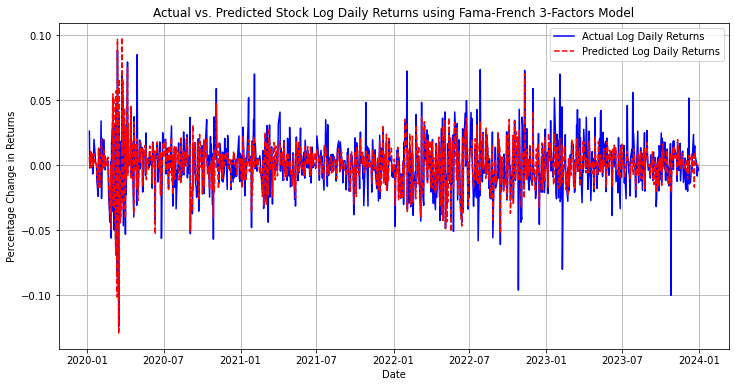

In [27]:
# Plotting the actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(df.index, y, label='Actual Log Daily Returns', color='blue', marker='', linestyle='-')
plt.plot(df.index, predictions, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Actual vs. Predicted Stock Log Daily Returns using Fama-French 3-Factors Model')
plt.xlabel('Date')
plt.ylabel('Percentage Change in Returns')
plt.legend()
plt.grid(True)
plt.show()

# Augmented Autoregression

In [28]:
from statsmodels.tsa.stattools import adfuller

df = GOOGL_STOCK

# Assuming 'Pct_Change_Close' is the daily percentage change of Google's stock
# Check stationarity
result = adfuller(df['Log_Daily_Returns'].dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

# Adding lagged returns as a feature (lag 1 day)
df['Lagged_Return'] = df['Log_Daily_Returns'].shift(1)

# Adding other potential features
features = ['Lagged_Return', 'Mkt-RF', 'SMB', 'HML', 'RF', 'VIXCLS']
df.dropna(subset=features, inplace=True)  # Drop any NA values from the DataFrame

X = df[features]
y = df['Log_Daily_Returns']

X = sm.add_constant(X)  # adding a constant
model = sm.OLS(y, X).fit()
predictions = model.predict(X)

rmse = np.sqrt(mean_squared_error(y, predictions))
print("Root Mean Squared Error:", rmse)
print(model.summary())

ADF Statistic: -10.340195
p-value: 0.000000
Root Mean Squared Error: 0.012551838980894677
                            OLS Regression Results                            
Dep. Variable:      Log_Daily_Returns   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     305.6
Date:                Thu, 18 Apr 2024   Prob (F-statistic):          7.98e-222
Time:                        18:44:32   Log-Likelihood:                 2967.8
No. Observations:                1003   AIC:                            -5922.
Df Residuals:                     996   BIC:                            -5887.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

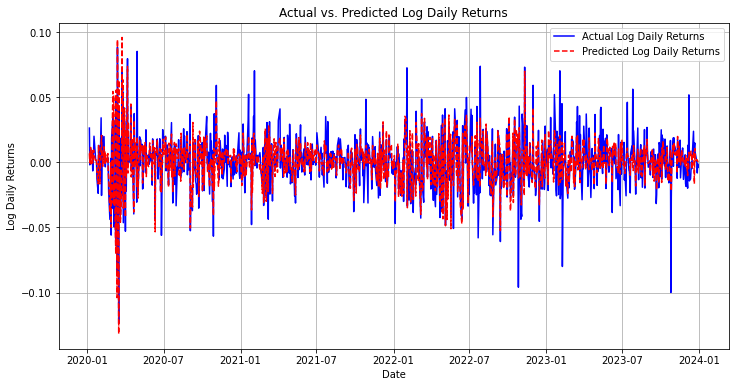

In [29]:
# Plotting actual vs predicted returns
plt.figure(figsize=(12, 6))
plt.plot(df.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(df.index, predictions, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Actual vs. Predicted Log Daily Returns')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.grid(True)
plt.show()

# Top 3 PCAs of Competitor Stocks

In [30]:
import yfinance as yf
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

# Define the tickers including Google (GOOGL) and its competitors
tickers = ['NVDA', 'TSLA', 'AAPL']
start_date = datetime(2020, 1, 1)
end_date = datetime(2023, 12, 31)
stock_data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']

# Calculate log returns for all stocks
log_returns = np.log(stock_data / stock_data.shift(1)).dropna()

combined_data = pd.concat([GOOGL_STOCK, log_returns], axis=1)
# combined_data = combined_data[::-1]

combined_data_clean = combined_data.dropna()
X = combined_data_clean.drop(columns=['Adj Close'])

# Save or use top_3_pca_df for further analysis
# Perform PCA on the features
pca = PCA(n_components=3)
X_transformed = pca.fit_transform(X)
y = combined_data_clean['Adj Close']

X_pca = X_transformed[:, :3]

# Define the dependent variable 'Adj Close'
y = combined_data_clean['Adj Close']

# Fit OLS model
X_with_intercept = sm.add_constant(X_pca)  # Add constant for the intercept term
ols_model = sm.OLS(y, X_with_intercept).fit()

# Get OLS model summary
print(ols_model.summary())

# Predict 'Adj Close' using the OLS model and PCA-transformed features
predicted_adj_close = ols_model.predict(X_with_intercept)

# Calculate RMSE
rmse = mean_squared_error(y, predicted_adj_close, squared=False)

# Print RMSE
print("RMSE:", rmse)

# Get R-squared from the OLS model
r_squared = ols_model.rsquared
print("R-squared:", r_squared)

[*********************100%%**********************]  3 of 3 completed

                            OLS Regression Results                            
Dep. Variable:              Adj Close   R-squared:                       0.862
Model:                            OLS   Adj. R-squared:                  0.862
Method:                 Least Squares   F-statistic:                     2088.
Date:                Thu, 18 Apr 2024   Prob (F-statistic):               0.00
Time:                        18:44:33   Log-Likelihood:                -3658.3
No. Observations:                1003   AIC:                             7325.
Df Residuals:                     999   BIC:                             7344.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        107.9939      0.294    367.627      0.0

# Section 4 Proposed Models
## Model 1 XGBoost model

In [31]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV

# Assuming GOOGL_STOCK is your DataFrame and it's already cleaned
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'T10Y3M',
       'OBMMIJUMBO30YF', 'DEXUSEU', 'DEXJPUS', 'DEXUSUK', 'CBBTCUSD',
       'CBETHUSD', 'DCOILBRENTEU', 'VIXCLS', 'DAAA', 'DBAA',
       'NIKKEI225', 'AMERIBOR', 'T5YIE', 'BAMLH0A0HYM2',
       'BAMLH0A0HYM2EY', 'DGS10', 'DGS1', 'DCOILWTICO', 'DHHNGSP', 'USRECD',
       'USRECDM', 'USRECDP', 'SP500', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
       'RF', 'ADS_Index', 'Log_Volume', 'Log_CBBTCUSD', 'Log_CBETHUSD',
       'Log_DGS10', 'Log_DGS1', 'Log_DCOILBRENTEU', 'Log_DCOILWTICO',
       'Log_NIKKEI225', 'Log_SP500', 'Daily_Returns',
    'VIX_SP500', 'DGS10_ADS', 'BTC_SP500',
       'OIL_SP500']  # Example features

# Change the target to 'Log_Daily_Returns'
X = GOOGL_STOCK[features]
y = GOOGL_STOCK['Log_Daily_Returns']  # Update the target to Log Daily Returns

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# param_grid = {
#     'max_depth': [3, 5, 7],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'n_estimators': [50, 100, 150],
#     'colsample_bytree': [0.3, 0.5, 0.7]
# }

# # Fitting 3 folds for each of 81 candidates, totalling 243 fits
# # Best parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 150}

# search = GridSearchCV(xgb.XGBRegressor(objective='reg:squarederror'), param_grid, cv=3, n_jobs=-1, verbose=1)
# search.fit(X_train, y_train)

# print("Best parameters:", search.best_params_)
# best_xgb_model = search.best_estimator_

# # Re-evaluate the model
# y_pred_best = best_xgb_model.predict(X_test)

# # Calculate RMSE and R^2
# rmse = np.sqrt(mean_squared_error(y_test, y_pred_best))
# r2 = r2_score(y_test, y_pred_best)

# # Model details
# print("XGBoost Model Summary")
# print("=======================")
# print("Model Configuration:")
# print(f"Objective: {best_xgb_model.objective}")
# print(f"Learning Rate: {best_xgb_model.get_params()['learning_rate']}")
# print(f"Max Depth: {best_xgb_model.get_params()['max_depth']}")
# print(f"N Estimators: {best_xgb_model.get_params()['n_estimators']}")
# print(f"Col Sample By Tree: {best_xgb_model.get_params()['colsample_bytree']}")
# print("\nPerformance Metrics:")
# print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
# print(f"R-squared (R2): {r2:.4f}")

In [32]:
# Best parameters found during grid search
best_params = {
    'colsample_bytree': 0.7,
    'learning_rate': 0.1,
    'max_depth': 3,
    'n_estimators': 150
}

# Creating XGBoost model with the best parameters
best_xgb_model = xgb.XGBRegressor(objective='reg:squarederror', **best_params)

# Fitting the model to the training data
best_xgb_model.fit(X_train, y_train)

# Making predictions on the test data
y_pred_best = best_xgb_model.predict(X_test)

# Calculate RMSE and R^2
rmse = np.sqrt(mean_squared_error(y_test, y_pred_best))
r2 = r2_score(y_test, y_pred_best)

# Model details
print("XGBoost Model Summary")
print("=======================")
print("Model Configuration:")
print(f"Objective: {best_xgb_model.objective}")
print(f"Learning Rate: {best_xgb_model.get_params()['learning_rate']}")
print(f"Max Depth: {best_xgb_model.get_params()['max_depth']}")
print(f"N Estimators: {best_xgb_model.get_params()['n_estimators']}")
print(f"Col Sample By Tree: {best_xgb_model.get_params()['colsample_bytree']}")
print("\nPerformance Metrics:")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R-squared (R2): {r2:.4f}")

XGBoost Model Summary
Model Configuration:
Objective: reg:squarederror
Learning Rate: 0.1
Max Depth: 3
N Estimators: 150
Col Sample By Tree: 0.7

Performance Metrics:
Root Mean Squared Error (RMSE): 0.0035
R-squared (R2): 0.9709


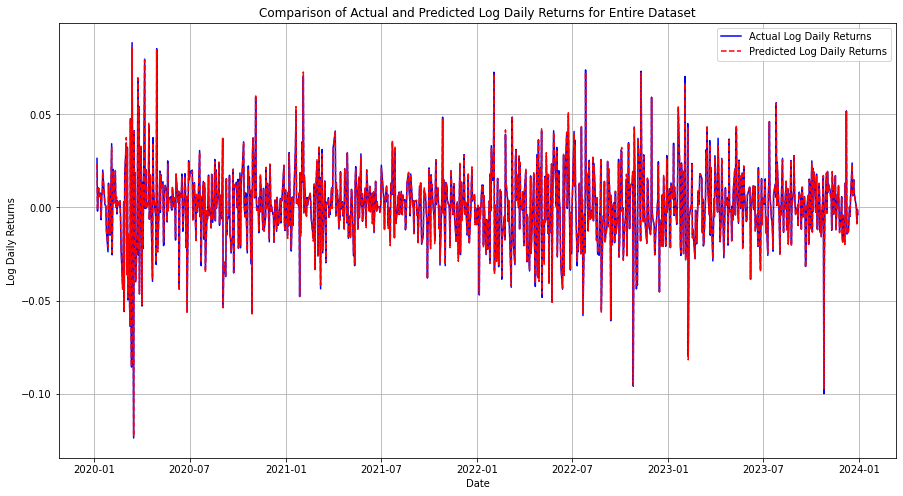

In [33]:
# Optionally re-train the model on the entire dataset
best_xgb_model.fit(X, y)

# Make predictions for the entire dataset
y_pred_full = best_xgb_model.predict(X)

# Convert predictions to a pandas Series with the same index as the original data
y_pred_full_series = pd.Series(y_pred_full, index=y.index)

# Sort the actual and predicted series by their index (date)
y_sorted = y.sort_index()
y_pred_full_sorted = y_pred_full_series.sort_index()

# Plotting
plt.figure(figsize=(15, 8))
plt.plot(y_sorted.index, y_sorted, label='Actual Log Daily Returns', color='blue', marker='', linestyle='-')
plt.plot(y_pred_full_sorted.index, y_pred_full_sorted, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns for Entire Dataset')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.grid(True)
plt.show()

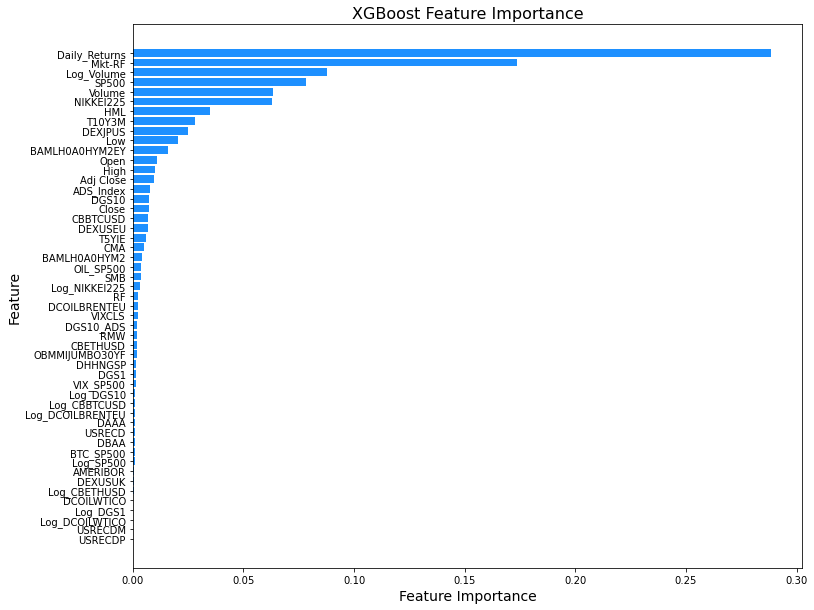

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Extract feature importances
feature_importances = best_xgb_model.feature_importances_

# Create a DataFrame for feature importances
df_feature_importance = pd.DataFrame(feature_importances, index=X_train.columns, columns=['feature importance'])
df_feature_importance = df_feature_importance.sort_values('feature importance', ascending=False)

# Plotting
plt.figure(figsize=(12, 10))
plt.barh(df_feature_importance.index, df_feature_importance['feature importance'], color='dodgerblue')
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title('XGBoost Feature Importance', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
plt.show()

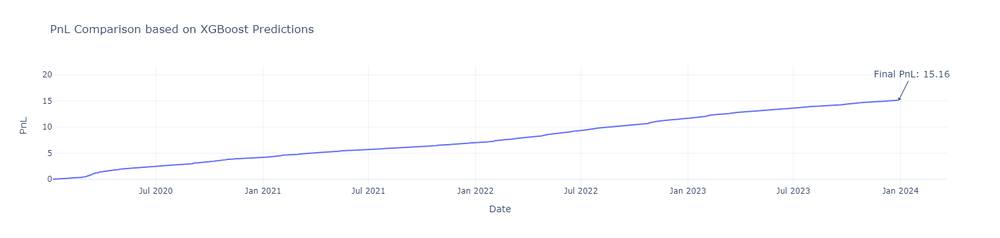

Final PnL based on XGBoost Predictions: 15.15706165578369


In [35]:
import plotly.graph_objects as go
 
# Generate trading signals based on predicted returns
def generate_signals(predicted_returns):
    signals = np.where(predicted_returns > 0, 1, -1)
    return signals
 
# Calculate PnL
def calculate_pnl(signals, actual_returns):
    pnl = np.cumsum(signals * actual_returns)
    return pnl
 
# Generate trading signals for predicted returns
signals_xgb = generate_signals(y_pred_full)
 
# Calculate PnL for XGBoost predictions
pnl_xgb = calculate_pnl(signals_xgb, y)
 
# Create an interactive PnL plot using Plotly
fig = go.Figure()
 
# Add a trace for the PnL based on XGBoost predictions
fig.add_trace(go.Scatter(x=y.index, y=pnl_xgb, mode='lines', name='PnL based on XGBoost Predictions'))
 
# Calculate profit and loss values for each data point
profit_loss = pnl_xgb - np.concatenate(([0], pnl_xgb[:-1]))
 
# Customize the layout
fig.update_layout(
    title='PnL Comparison based on XGBoost Predictions',
    xaxis_title='Date',
    yaxis_title='PnL',
    hovermode='x unified',
    legend=dict(x=0, y=1, orientation='h'),
    template='plotly_white'
)
 
# Add hover annotations with profit and loss values
fig.update_traces(
    hovertemplate="Date: %{x}<br>PnL: %{y:.2f}<br>Profit/Loss: %{text:.2f}",
    text=profit_loss
)
 
# Add final PnL value as an annotation
final_pnl = pnl_xgb[-1]
fig.add_annotation(
    x=y.index[-1],
    y=final_pnl,
    text=f"Final PnL: {final_pnl:.2f}",
    showarrow=True,
    arrowhead=1,
    ax=20,
    ay=-40,
    bgcolor="rgba(255, 255, 255, 0.8)",
    font=dict(size=14)
)
 
# Display the plot
fig.show()
 
# Print final PnL values
print("Final PnL based on XGBoost Predictions:", pnl_xgb[-1])

## Model 2 CatBoost model

In [36]:
!pip install catboost


In [37]:
from catboost import CatBoostRegressor

# # Define parameter grid
# param_grid = {
#     'depth': [3, 6, 9],
#     'learning_rate' : [0.01, 0.05, 0.1],
#     'iterations': [100, 300, 500]
# }

# # Fitting 3 folds for each of 27 candidates, totalling 81 fits
# # Best parameters: {'depth': 3, 'iterations': 500, 'learning_rate': 0.1}

# # Setup CatBoost regressor
# cat_model = CatBoostRegressor(loss_function='RMSE', verbose=False)

# # Grid search
# grid_search = GridSearchCV(cat_model, param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)
# grid_search.fit(X_train, y_train)

# # Best model
# best_cat_model = grid_search.best_estimator_
# print("Best parameters:", grid_search.best_params_)

# # Re-evaluation
# y_pred_cat_best = best_cat_model.predict(X_test)

# # RMSE and R^2
# rmse_cat = np.sqrt(mean_squared_error(y_test, y_pred_cat_best))
# r2_cat = r2_score(y_test, y_pred_cat_best)

# # Model summary
# print("CatBoost Model Summary")
# print("=======================")
# print(f"Root Mean Squared Error (RMSE): {rmse_cat:.4f}")
# print(f"R-squared (R2): {r2_cat:.4f}")

In [38]:
# Best parameters found during grid search
best_params_cat = {
    'depth': 3,
    'learning_rate': 0.1,
    'iterations': 500
}

# Creating CatBoost model with the best parameters
best_cat_model = CatBoostRegressor(loss_function='RMSE', **best_params_cat, verbose=False)

# Fitting the model to the training data
best_cat_model.fit(X_train, y_train)

# Making predictions on the test data
y_pred_cat_best = best_cat_model.predict(X_test)

# Calculate RMSE and R^2
rmse_cat = np.sqrt(mean_squared_error(y_test, y_pred_cat_best))
r2_cat = r2_score(y_test, y_pred_cat_best)

# Model summary
print("CatBoost Model Summary")
print("=======================")
print(f"Root Mean Squared Error (RMSE): {rmse_cat:.4f}")
print(f"R-squared (R2): {r2_cat:.4f}")


CatBoost Model Summary
Root Mean Squared Error (RMSE): 0.0031
R-squared (R2): 0.9773


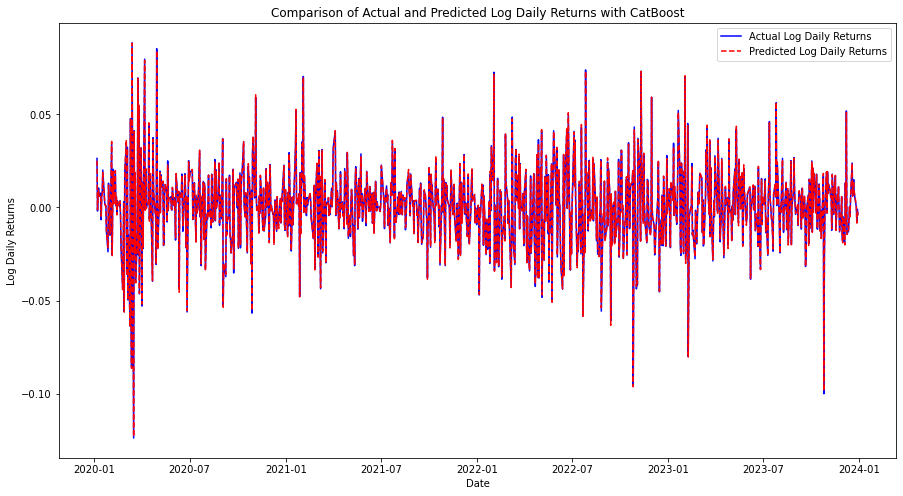

In [39]:
# Optionally re-train on the entire dataset
best_cat_model.fit(X, y)

# Predictions for the entire dataset
y_pred_full_cat = best_cat_model.predict(X)

# Convert predictions to pandas Series for plotting
y_pred_full_cat_series = pd.Series(y_pred_full_cat, index=y.index)

# Plotting
plt.figure(figsize=(15, 8))
plt.plot(y.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(y.index, y_pred_full_cat_series, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns with CatBoost')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.show()

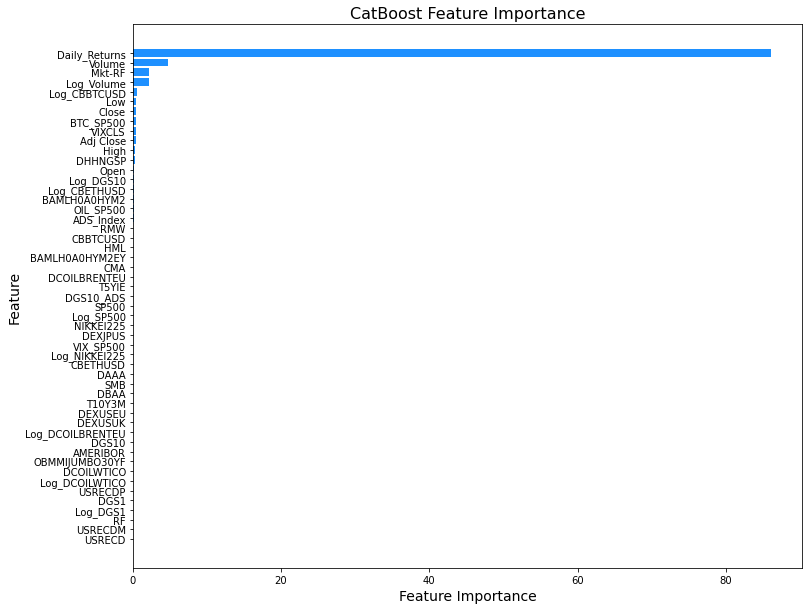

In [40]:
# Extract feature importances
feature_importances_cat = best_cat_model.feature_importances_

# Create a DataFrame for feature importances
df_feature_importance_cat = pd.DataFrame(feature_importances_cat, index=X_train.columns, columns=['feature importance'])
df_feature_importance_cat.sort_values(by='feature importance', ascending=False, inplace=True)

# Plotting feature importance
plt.figure(figsize=(12, 10))
plt.barh(df_feature_importance_cat.index, df_feature_importance_cat['feature importance'], color='dodgerblue')
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title('CatBoost Feature Importance', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
plt.show()


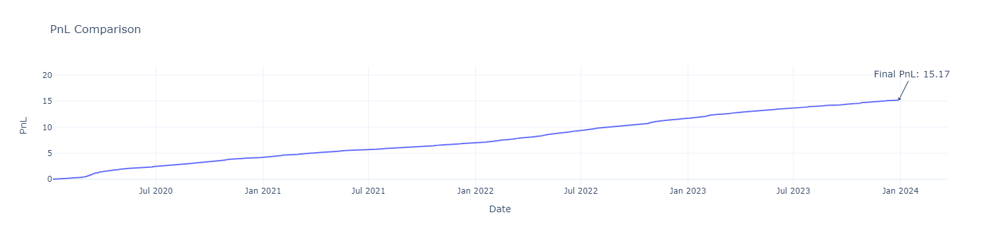

Final PnL based on CatBoost Predictions: 15.171121511997672


In [41]:
import plotly.graph_objects as go
# ... (previous code remains the same)
# Generate trading signals based on predicted returns
def generate_signals(predicted_returns):
    signals = np.where(predicted_returns > 0, 1, -1)
    return signals
# Calculate PnL
def calculate_pnl(signals, actual_returns):
    pnl = np.cumsum(signals * actual_returns)
    return pnl
# Generate trading signals for predicted returns
signals_cat = generate_signals(y_pred_full_cat)
# Calculate PnL for CatBoost predictions
pnl_cat = calculate_pnl(signals_cat, y)
# Create an interactive PnL plot using Plotly
fig = go.Figure()
# Add a trace for the PnL based on CatBoost predictions
fig.add_trace(go.Scatter(x=y.index, y=pnl_cat, mode='lines', name='PnL based on CatBoost Predictions'))
# Calculate profit and loss values for each data point
profit_loss = pnl_cat - np.concatenate(([0], pnl_cat[:-1]))
# Customize the layout
fig.update_layout(
    title='PnL Comparison',
    xaxis_title='Date',
    yaxis_title='PnL',
    hovermode='x unified',
    legend=dict(x=0, y=1, orientation='h'),
    template='plotly_white'
)
# Add hover annotations with profit and loss values
fig.update_traces(
    hovertemplate="Date: %{x}<br>PnL: %{y:.2f}<br>Profit/Loss: %{text:.2f}",
    text=profit_loss
)
# Add final PnL value as an annotation
final_pnl = pnl_cat[-1]
fig.add_annotation(
    x=y.index[-1],
    y=final_pnl,
    text=f"Final PnL: {final_pnl:.2f}",
    showarrow=True,
    arrowhead=1,
    ax=20,
    ay=-40,
    bgcolor="rgba(255, 255, 255, 0.8)",
    font=dict(size=14)
)
# Display the plot
fig.show()
# Print final PnL values
print("Final PnL based on CatBoost Predictions:", pnl_cat[-1])

## Model 3 Gradient Boosting Regressor model

In [42]:
from sklearn.ensemble import GradientBoostingRegressor

# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_depth': [3, 5, 7],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# # Fitting 3 folds for each of 243 candidates, totalling 729 fits
# # Best parameters: {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}

# # Create a GradientBoostingRegressor object
# gbr = GradientBoostingRegressor()

# # Set up GridSearchCV
# grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)
# grid_search.fit(X_train, y_train)

# # Best model
# best_gbr_model = grid_search.best_estimator_
# print("Best parameters:", grid_search.best_params_)

# # Making predictions
# y_pred_gbr = best_gbr_model.predict(X_test)

# # Calculate RMSE and R^2
# rmse_gbr = np.sqrt(mean_squared_error(y_test, y_pred_gbr))
# r2_gbr = r2_score(y_test, y_pred_gbr)

# # Model details
# print("Gradient Boosting Regressor Model Summary")
# print("==========================================")
# print(f"Root Mean Squared Error (RMSE): {rmse_gbr:.4f}")
# print(f"R-squared (R2): {r2_gbr:.4f}")

In [43]:
# Best parameters found during grid search
best_params_gbr = {
    'n_estimators': 200,
    'learning_rate': 0.1,
    'max_depth': 5,
    'min_samples_split': 10,
    'min_samples_leaf': 2
}

# Creating GradientBoostingRegressor model with the best parameters
best_gbr_model = GradientBoostingRegressor(**best_params_gbr)

# Fitting the model to the training data
best_gbr_model.fit(X_train, y_train)

# Making predictions on the test data
y_pred_gbr = best_gbr_model.predict(X_test)

# Calculate RMSE and R^2
rmse_gbr = np.sqrt(mean_squared_error(y_test, y_pred_gbr))
r2_gbr = r2_score(y_test, y_pred_gbr)

# Model summary
print("Gradient Boosting Regressor Model Summary")
print("==========================================")
print(f"Root Mean Squared Error (RMSE): {rmse_gbr:.4f}")
print(f"R-squared (R2): {r2_gbr:.4f}")

Gradient Boosting Regressor Model Summary
Root Mean Squared Error (RMSE): 0.0025
R-squared (R2): 0.9849


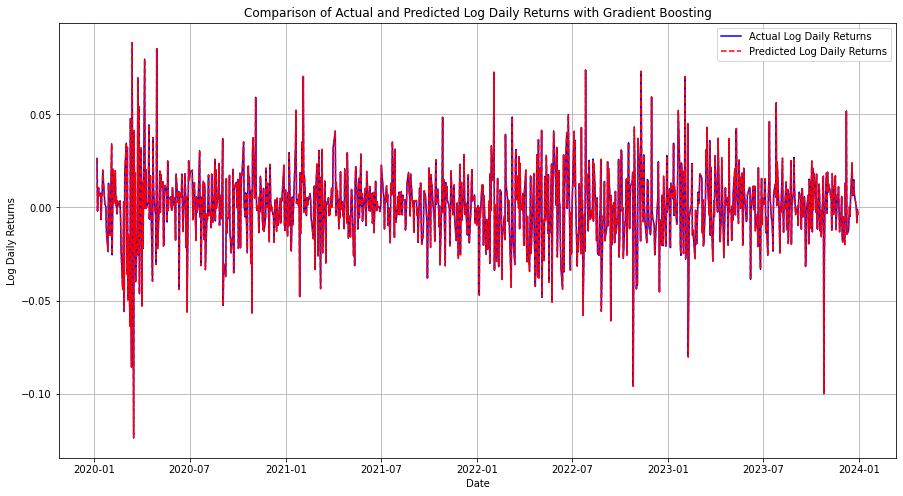

In [44]:
# Optionally re-train the model on the entire dataset
best_gbr_model.fit(X, y)

# Make predictions for the entire dataset
y_pred_full_gbr = best_gbr_model.predict(X)

# Convert predictions to a pandas Series with the same index as the original data
y_pred_full_gbr_series = pd.Series(y_pred_full_gbr, index=y.index)

# Plotting
plt.figure(figsize=(15, 8))
plt.plot(y.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(y.index, y_pred_full_gbr_series, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns with Gradient Boosting')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.grid(True)
plt.show()

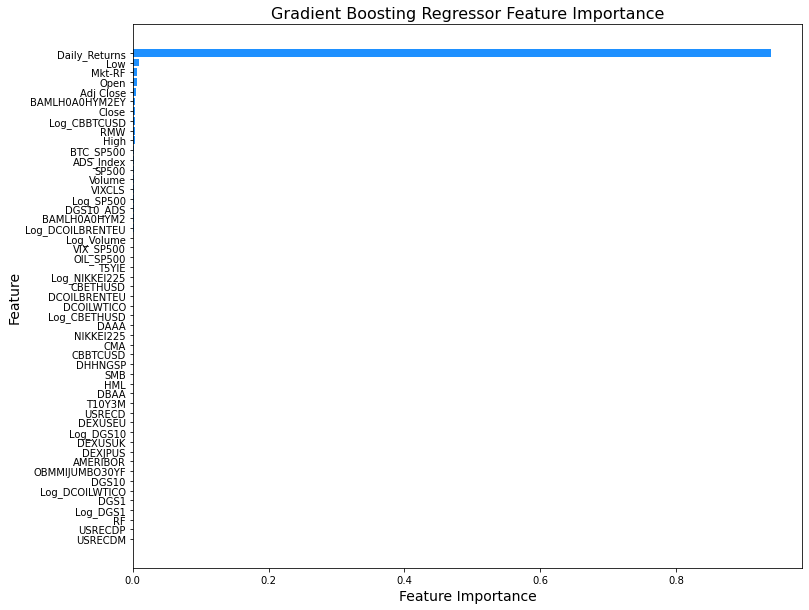

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

# Extract feature importances
feature_importances_gbr = best_gbr_model.feature_importances_

# Create a DataFrame for feature importances
df_feature_importance_gbr = pd.DataFrame(feature_importances_gbr, index=X_train.columns, columns=['feature importance'])
df_feature_importance_gbr.sort_values(by='feature importance', ascending=False, inplace=True)

# Plotting feature importance
plt.figure(figsize=(12, 10))
plt.barh(df_feature_importance_gbr.index, df_feature_importance_gbr['feature importance'], color='dodgerblue')
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title('Gradient Boosting Regressor Feature Importance', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
plt.show()

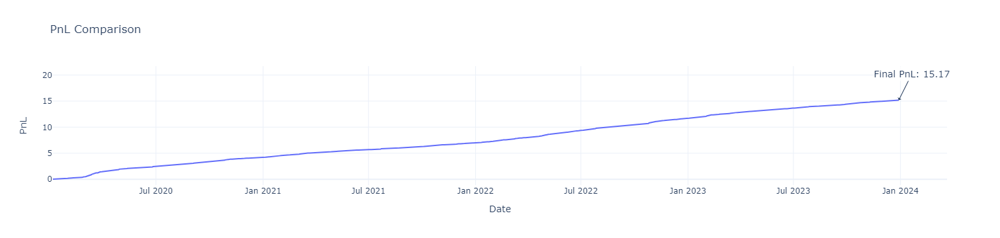

Final PnL based on Gradient Boosting Regressor Predictions: 15.17414673089879


In [46]:
# Generate trading signals based on predicted returns
def generate_signals(predicted_returns):
    signals = np.where(predicted_returns > 0, 1, -1)
    return signals
# Calculate PnL
def calculate_pnl(signals, actual_returns):
    pnl = np.cumsum(signals * actual_returns)
    return pnl
# Generate trading signals for predicted returns
signals_gbr = generate_signals(y_pred_full_gbr)
# Calculate PnL for Gradient Boosting Regressor predictions
pnl_gbr = calculate_pnl(signals_gbr, y)
# Create an interactive PnL plot using Plotly
fig = go.Figure()
# Add a trace for the PnL based on Gradient Boosting Regressor predictions
fig.add_trace(go.Scatter(x=y.index, y=pnl_gbr, mode='lines', name='PnL based on Gradient Boosting Regressor Predictions'))
# Calculate profit and loss values for each data point
profit_loss = pnl_gbr - np.concatenate(([0], pnl_gbr[:-1]))
# Customize the layout
fig.update_layout(
    title='PnL Comparison',
    xaxis_title='Date',
    yaxis_title='PnL',
    hovermode='x unified',
    legend=dict(x=0, y=1, orientation='h'),
    template='plotly_white'
)
# Add hover annotations with profit and loss values
fig.update_traces(
    hovertemplate="Date: %{x}<br>PnL: %{y:.2f}<br>Profit/Loss: %{text:.2f}",
    text=profit_loss
)
# Add final PnL value as an annotation
final_pnl = pnl_gbr[-1]
fig.add_annotation(
    x=y.index[-1],
    y=final_pnl,
    text=f"Final PnL: {final_pnl:.2f}",
    showarrow=True,
    arrowhead=1,
    ax=20,
    ay=-40,
    bgcolor="rgba(255, 255, 255, 0.8)",
    font=dict(size=14)
)
# Display the plot
fig.show()
# Print final PnL values
print("Final PnL based on Gradient Boosting Regressor Predictions:", pnl_gbr[-1])

## Model 4 Random Forest Regressor

In [47]:
from sklearn.ensemble import RandomForestRegressor

# # Define parameter grid
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'max_features': ['auto', 'sqrt', 'log2'],
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# # Fitting 3 folds for each of 324 candidates, totalling 972 fits
# # Best parameters: {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

# # Create the Random Forest Regressor
# rf = RandomForestRegressor()

# # Grid search to find the best parameters
# grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)
# grid_search_rf.fit(X_train, y_train)

# # Best model after grid search
# best_rf_model = grid_search_rf.best_estimator_
# print("Best parameters:", grid_search_rf.best_params_)

# # Prediction on test data
# y_pred_rf = best_rf_model.predict(X_test)

# # RMSE and R^2
# rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
# r2_rf = r2_score(y_test, y_pred_rf)

# # Model summary
# print("Random Forest Model Summary")
# print("============================")
# print(f"Root Mean Squared Error (RMSE): {rmse_rf:.4f}")
# print(f"R-squared (R2): {r2_rf:.4f}")

In [48]:
# Best parameters found during grid search
best_params_rf = {
    'n_estimators': 100,
    'max_features': 'sqrt',
    'max_depth': 30,
    'min_samples_split': 2,
    'min_samples_leaf': 1
}

# Creating Random Forest Regressor model with the best parameters
best_rf_model = RandomForestRegressor(**best_params_rf)

# Fitting the model to the training data
best_rf_model.fit(X_train, y_train)

# Making predictions on the test data
y_pred_rf = best_rf_model.predict(X_test)

# Calculate RMSE and R^2
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

# Model summary
print("Random Forest Model Summary")
print("============================")
print(f"Root Mean Squared Error (RMSE): {rmse_rf:.4f}")
print(f"R-squared (R2): {r2_rf:.4f}")

Random Forest Model Summary
Root Mean Squared Error (RMSE): 0.0085
R-squared (R2): 0.8311


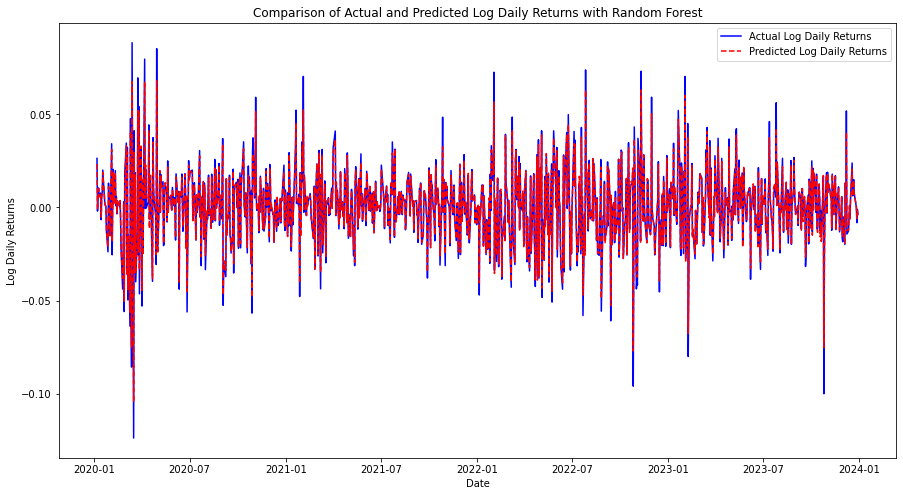

In [49]:
# Re-train on entire dataset
best_rf_model.fit(X, y)

# Predict entire dataset
y_pred_full_rf = best_rf_model.predict(X)

# Plotting
y_pred_full_rf_series = pd.Series(y_pred_full_rf, index=y.index)
plt.figure(figsize=(15, 8))
plt.plot(y.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(y.index, y_pred_full_rf_series, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns with Random Forest')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.show()

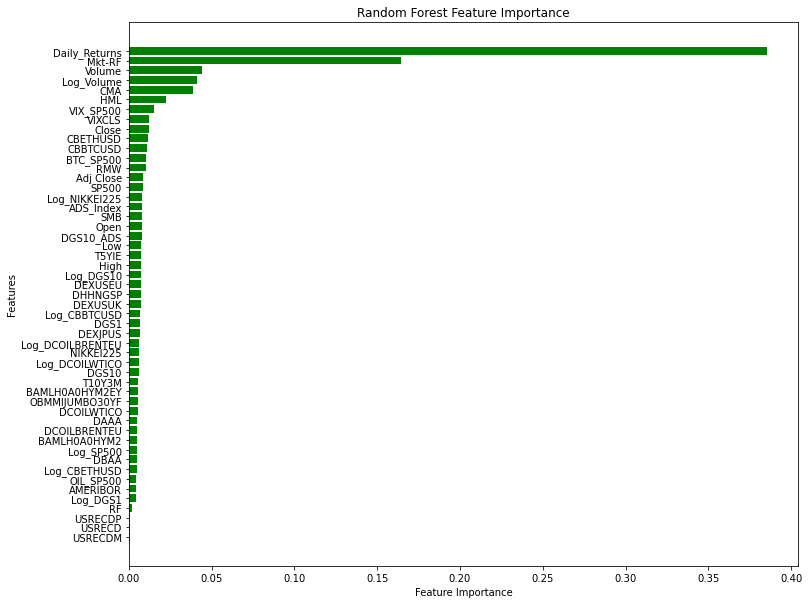

In [50]:
# Feature importance visualization
df_feature_importance_rf = pd.DataFrame(best_rf_model.feature_importances_, index=X_train.columns, columns=['feature importance'])
df_feature_importance_rf.sort_values('feature importance', ascending=False, inplace=True)
plt.figure(figsize=(12, 10))
plt.barh(df_feature_importance_rf.index, df_feature_importance_rf['feature importance'], color='green')
plt.title('Random Forest Feature Importance')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.gca().invert_yaxis()
plt.show()

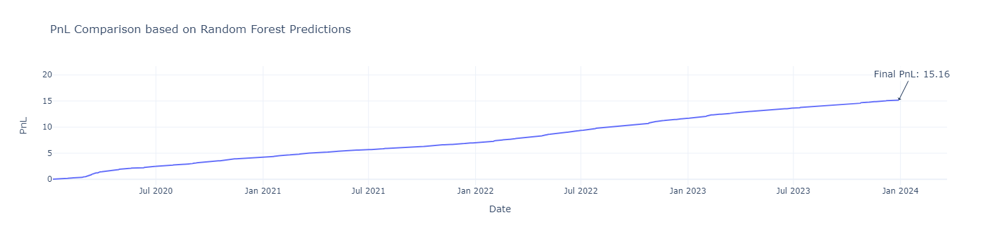

Final PnL based on Random Forest Predictions: 15.160906214419718


In [51]:
# Generate trading signals based on predicted returns
def generate_signals(predicted_returns):
    signals = np.where(predicted_returns > 0, 1, -1)
    return signals
# Calculate PnL
def calculate_pnl(signals, actual_returns):
    pnl = np.cumsum(signals * actual_returns)
    return pnl
# Generate trading signals for predicted returns
signals_rf = generate_signals(y_pred_full_rf)
# Calculate PnL for Random Forest predictions
pnl_rf = calculate_pnl(signals_rf, y)
# Create an interactive PnL plot using Plotly
fig = go.Figure()
# Add a trace for the PnL based on Random Forest predictions
fig.add_trace(go.Scatter(x=y.index, y=pnl_rf, mode='lines', name='PnL based on Random Forest Predictions'))
# Calculate profit and loss values for each data point
profit_loss = pnl_rf - np.concatenate(([0], pnl_rf[:-1]))
# Customize the layout
fig.update_layout(
    title='PnL Comparison based on Random Forest Predictions',
    xaxis_title='Date',
    yaxis_title='PnL',
    hovermode='x unified',
    legend=dict(x=0, y=1, orientation='h'),
    template='plotly_white'
)
# Add hover annotations with profit and loss values
fig.update_traces(
    hovertemplate="Date: %{x}<br>PnL: %{y:.2f}<br>Profit/Loss: %{text:.2f}",
    text=profit_loss
)
# Add final PnL value as an annotation
final_pnl = pnl_rf[-1]
fig.add_annotation(
    x=y.index[-1],
    y=final_pnl,
    text=f"Final PnL: {final_pnl:.2f}",
    showarrow=True,
    arrowhead=1,
    ax=20,
    ay=-40,
    bgcolor="rgba(255, 255, 255, 0.8)",
    font=dict(size=14)
)
# Display the plot
fig.show()
# Print final PnL values
print("Final PnL based on Random Forest Predictions:", pnl_rf[-1])

## Model 5 Linear Regression Model

In [52]:
from sklearn.linear_model import LinearRegression

# Create Linear Regression model
lr_model = LinearRegression()

# Fit the model
lr_model.fit(X_train, y_train)

# Making predictions
y_pred_lr = lr_model.predict(X_test)

# Calculate RMSE and R^2
rmse_lr = np.sqrt(mean_squared_error(y_test, y_pred_lr))
r2_lr = r2_score(y_test, y_pred_lr)

# Model summary
print("Linear Regression Model Summary")
print("================================")
print(f"Root Mean Squared Error (RMSE): {rmse_lr:.4f}")
print(f"R-squared (R2): {r2_lr:.4f}")

Linear Regression Model Summary
Root Mean Squared Error (RMSE): 0.0046
R-squared (R2): 0.9506


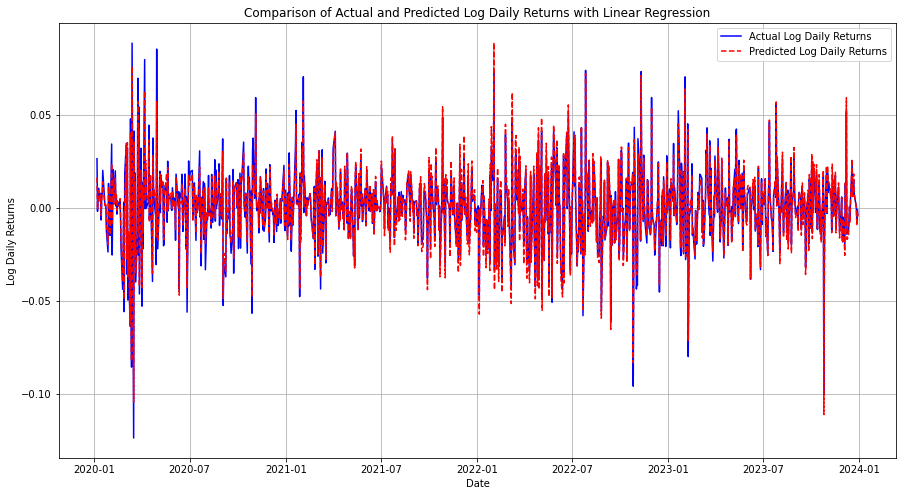

In [53]:
# Optionally re-train the model on the entire dataset
lr_model.fit(X, y)

# Make predictions for the entire dataset
y_pred_full_lr = lr_model.predict(X)

# Convert predictions to a pandas Series for plotting
y_pred_full_lr_series = pd.Series(y_pred_full_lr, index=y.index)

# Plotting
plt.figure(figsize=(15, 8))
plt.plot(y.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(y.index, y_pred_full_lr_series, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns with Linear Regression')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.grid(True)
plt.show()

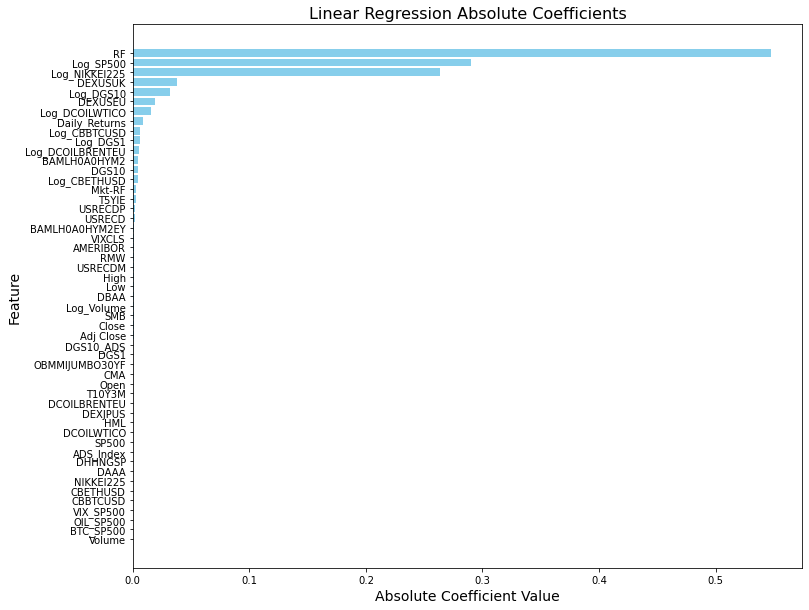

In [54]:
# 'lr_model' is the trained Linear Regression model and 'features' is the list of feature names
coefficients = pd.DataFrame(lr_model.coef_, index=features, columns=['Coefficients'])

# Take the absolute values of coefficients for visualization
coefficients['Absolute Coefficients'] = coefficients['Coefficients'].abs()

# Sort by absolute values
coefficients.sort_values('Absolute Coefficients', ascending=False, inplace=True)

# Plotting absolute values of coefficients
plt.figure(figsize=(12, 10))
plt.barh(coefficients.index, coefficients['Absolute Coefficients'], color='skyblue')
plt.xlabel('Absolute Coefficient Value', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.title('Linear Regression Absolute Coefficients', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to have the most impactful feature on top
plt.show()

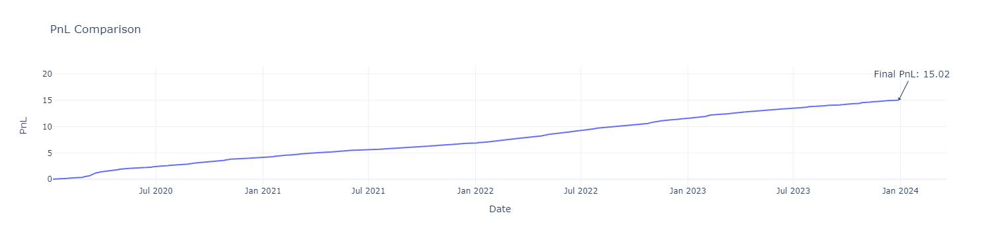

Final PnL based on Linear Regression Predictions: 15.021814368730627


In [55]:
# Generate trading signals based on predicted returns
def generate_signals(predicted_returns):
    signals = np.where(predicted_returns > 0, 1, -1)
    return signals
 
# Calculate PnL
def calculate_pnl(signals, actual_returns):
    pnl = np.cumsum(signals * actual_returns)
    return pnl
 
# Generate trading signals for predicted returns
signals_lr = generate_signals(y_pred_full_lr)
 
# Calculate PnL for Linear Regression predictions
pnl_lr = calculate_pnl(signals_lr, y)
 
# Create an interactive PnL plot using Plotly
fig = go.Figure()
 
# Add a trace for the PnL based on Linear Regression predictions
fig.add_trace(go.Scatter(x=y.index, y=pnl_lr, mode='lines', name='PnL based on Linear Regression Predictions'))
 
# Calculate profit and loss values for each data point
profit_loss = pnl_lr - np.concatenate(([0], pnl_lr[:-1]))
 
# Customize the layout
fig.update_layout(
    title='PnL Comparison',
    xaxis_title='Date',
    yaxis_title='PnL',
    hovermode='x unified',
    legend=dict(x=0, y=1, orientation='h'),
    template='plotly_white'
)
 
# Add hover annotations with profit and loss values
fig.update_traces(
    hovertemplate="Date: %{x}<br>PnL: %{y:.2f}<br>Profit/Loss: %{text:.2f}",
    text=profit_loss
)
 
# Add final PnL value as an annotation
final_pnl = pnl_lr[-1]
fig.add_annotation(
    x=y.index[-1],
    y=final_pnl,
    text=f"Final PnL: {final_pnl:.2f}",
    showarrow=True,
    arrowhead=1,
    ax=20,
    ay=-40,
    bgcolor="rgba(255, 255, 255, 0.8)",
    font=dict(size=14)
)
 
# Display the plot
fig.show()
 
# Print final PnL values
print("Final PnL based on Linear Regression Predictions:", pnl_lr[-1])

# ElasticNet Regressor Model

In [56]:
from sklearn.linear_model import ElasticNet
from sklearn.feature_selection import SelectFromModel

# Grid search setup
param_grid = {
    'alpha': [0.1, 0.5, 1, 2],
    'l1_ratio': [0.1, 0.5, 0.9]
}

# ElasticNet model setup
elastic_net = ElasticNet()
grid_search = GridSearchCV(estimator=elastic_net, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Best model
best_elastic_net = grid_search.best_estimator_
print("Best parameters:", grid_search.best_params_)

# Making predictions
y_pred_en = best_elastic_net.predict(X_test)

# Calculate RMSE and R^2
rmse_en = np.sqrt(mean_squared_error(y_test, y_pred_en))
r2_en = r2_score(y_test, y_pred_en)

# Model details
print("ElasticNet Model Summary")
print("=========================")
print(f"Root Mean Squared Error (RMSE): {rmse_en:.4f}")
print(f"R-squared (R2): {r2_en:.4f}")

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best parameters: {'alpha': 0.1, 'l1_ratio': 0.1}
ElasticNet Model Summary
Root Mean Squared Error (RMSE): 0.0075
R-squared (R2): 0.8668


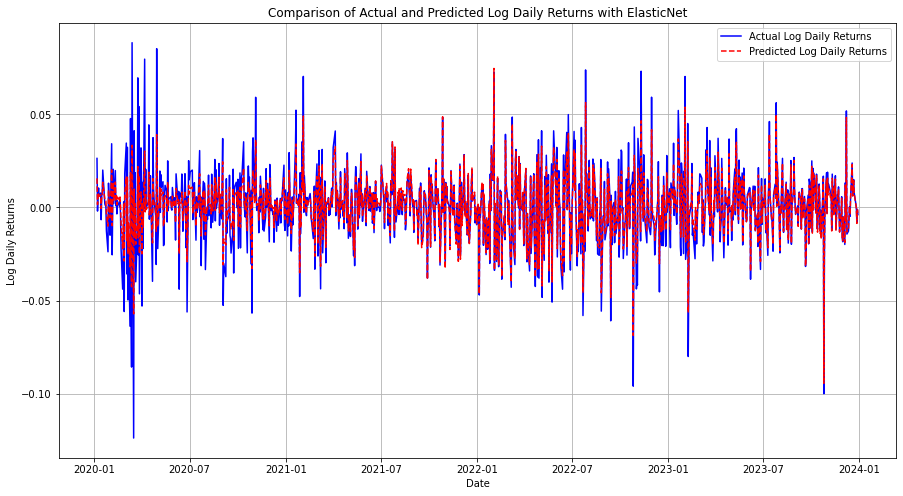

In [57]:
# Optionally re-train the model on the entire dataset
best_elastic_net.fit(X, y)

# Make predictions for the entire dataset
y_pred_full_en = best_elastic_net.predict(X)

# Convert predictions to a pandas Series with the same index as the original data
y_pred_full_en_series = pd.Series(y_pred_full_en, index=y.index)

# Plotting
plt.figure(figsize=(15, 8))
plt.plot(y.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(y.index, y_pred_full_en_series, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns with ElasticNet')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.grid(True)
plt.show()

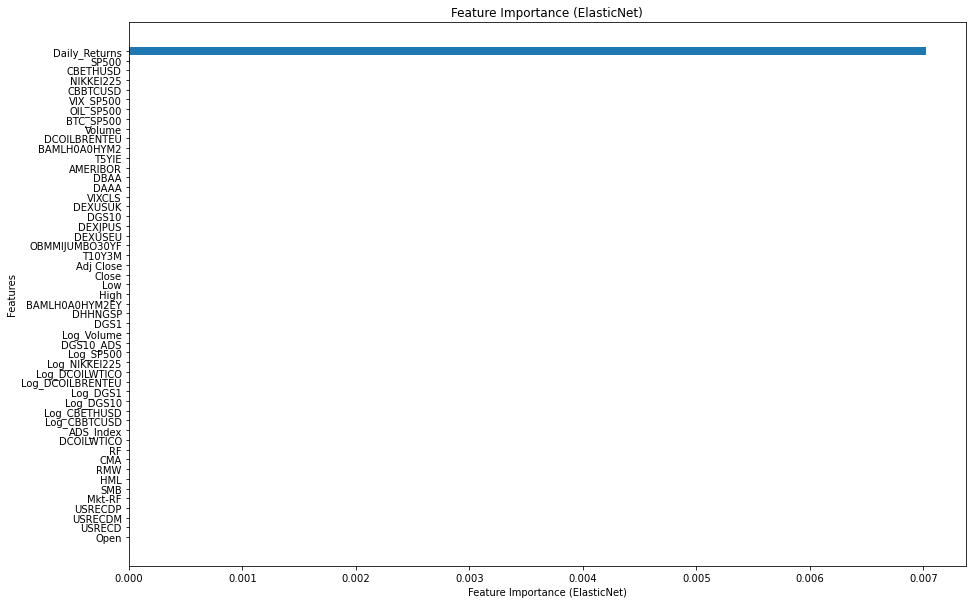

Selected Features (ElasticNet):
Index([], dtype='object')


In [58]:
# Get feature importances from ElasticNet coefficients
elastic_net_importances = np.abs(best_elastic_net.coef_)

# Sort feature importances and corresponding feature names
sorted_indices = np.argsort(elastic_net_importances)
sorted_importances = elastic_net_importances[sorted_indices]
sorted_features = X.columns[sorted_indices]

# Plot feature importances for ElasticNet in decreasing order
plt.figure(figsize=(15, 10))
plt.barh(range(len(sorted_features)), sorted_importances)
plt.yticks(range(len(sorted_features)), sorted_features)
plt.xlabel('Feature Importance (ElasticNet)')
plt.ylabel('Features')
plt.title('Feature Importance (ElasticNet)')
plt.show()

# Feature selection using SelectFromModel with ElasticNet
sfm = SelectFromModel(best_elastic_net, threshold=0.05)  # Adjust the threshold as needed
sfm.fit(X_train, y_train)

# Get selected features after scaling
selected_features = X.columns[sfm.get_support()]
print("Selected Features (ElasticNet):")
print(selected_features)

# Section 3: 
## Lasso Regression Model

In [59]:
from sklearn.linear_model import Lasso

# Hyperparameter grid
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10]
}

# Lasso Regression model
lasso = Lasso()
grid_search = GridSearchCV(lasso, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1)
grid_search.fit(X_train, y_train)

# Best model
best_lasso = grid_search.best_estimator_
print("Best parameters:", grid_search.best_params_)

# Making predictions
y_pred_lasso = best_lasso.predict(X_test)

# Calculate RMSE and R^2
rmse_lasso = np.sqrt(mean_squared_error(y_test, y_pred_lasso))
r2_lasso = r2_score(y_test, y_pred_lasso)

# Model details
print("Lasso Regression Model Summary")
print("==============================")
print(f"Root Mean Squared Error (RMSE): {rmse_lasso:.4f}")
print(f"R-squared (R2): {r2_lasso:.4f}")

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters: {'alpha': 0.0001}
Lasso Regression Model Summary
Root Mean Squared Error (RMSE): 0.0045
R-squared (R2): 0.9532


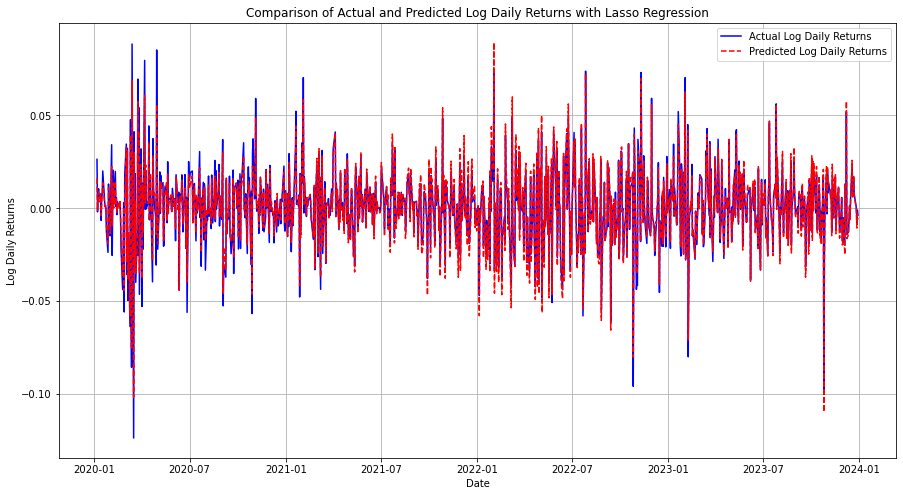

In [60]:
# Optionally re-train the model on the entire dataset
best_lasso.fit(X, y)

# Make predictions for the entire dataset
y_pred_full_lasso = best_lasso.predict(X)

# Convert predictions to a pandas Series with the same index as the original data
y_pred_full_lasso_series = pd.Series(y_pred_full_lasso, index=y.index)

# Plotting
plt.figure(figsize=(15, 8))
plt.plot(y.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(y.index, y_pred_full_lasso_series, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns with Lasso Regression')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.grid(True)
plt.show()

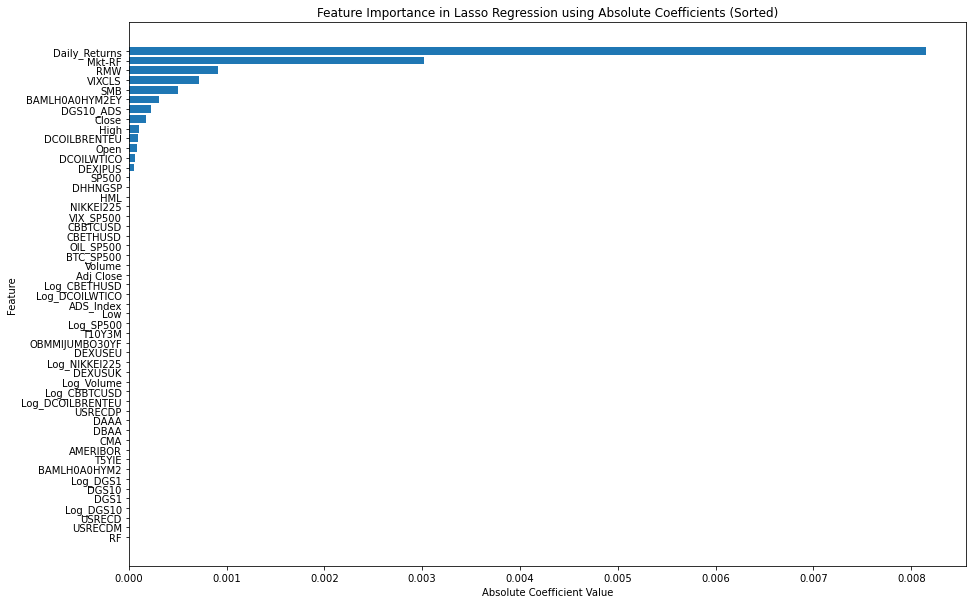

In [61]:
# Get the absolute values of the coefficients
lasso_coefs_abs = np.abs(best_lasso.coef_)
features = X.columns
 
# Sorting the features by the absolute coefficient values in descending order
indices = np.argsort(lasso_coefs_abs)[::-1]  # Sort by absolute value, then reverse for descending order
sorted_features = features[indices]
sorted_coefs_abs = lasso_coefs_abs[indices]
 
# Plotting the feature importances using absolute values
plt.figure(figsize=(15, 10))
plt.barh(sorted_features, sorted_coefs_abs)
plt.xlabel('Absolute Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance in Lasso Regression using Absolute Coefficients (Sorted)')
plt.gca().invert_yaxis()  # Invert y-axis so the most important feature is on top
plt.show()

## Ridge Regression Model

In [62]:
from sklearn.linear_model import Ridge

# Hyperparameter grid
param_grid = {
    'alpha': [0.1, 1, 10, 100, 1000]
}

# Ridge Regression model
ridge = Ridge()
grid_search = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1)
grid_search.fit(X_train, y_train)

# Best model
best_ridge = grid_search.best_estimator_
print("Best parameters:", grid_search.best_params_)

# Making predictions
y_pred_ridge = best_ridge.predict(X_test)

# Calculate RMSE and R^2
rmse_ridge = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
r2_ridge = r2_score(y_test, y_pred_ridge)

# Model details
print("Ridge Regression Model Summary")
print("==============================")
print(f"Root Mean Squared Error (RMSE): {rmse_ridge:.4f}")
print(f"R-squared (R2): {r2_ridge:.4f}")

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters: {'alpha': 10}
Ridge Regression Model Summary
Root Mean Squared Error (RMSE): 0.0044
R-squared (R2): 0.9539


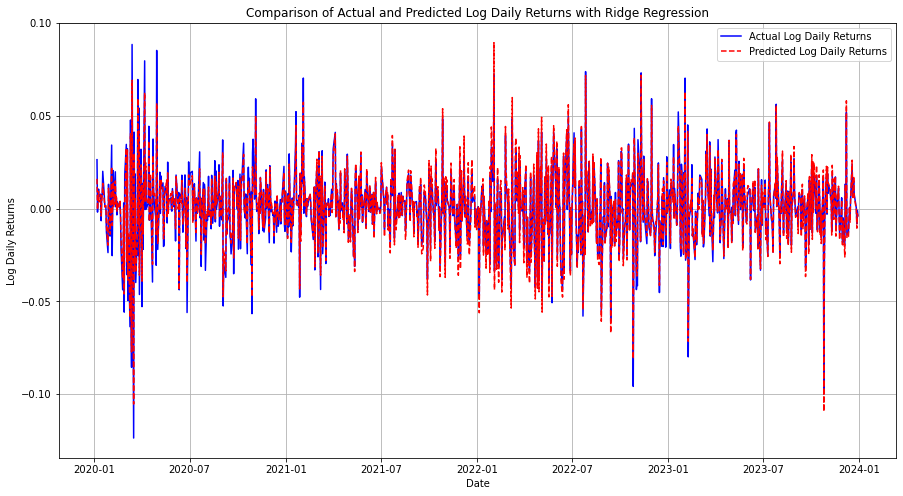

In [63]:
# Optionally re-train the model on the entire dataset
best_ridge.fit(X, y)

# Make predictions for the entire dataset
y_pred_full_ridge = best_ridge.predict(X)

# Convert predictions to a pandas Series with the same index as the original data
y_pred_full_ridge_series = pd.Series(y_pred_full_ridge, index=y.index)

# Plotting
plt.figure(figsize=(15, 8))
plt.plot(y.index, y, label='Actual Log Daily Returns', color='blue')
plt.plot(y.index, y_pred_full_ridge_series, label='Predicted Log Daily Returns', color='red', linestyle='--')
plt.title('Comparison of Actual and Predicted Log Daily Returns with Ridge Regression')
plt.xlabel('Date')
plt.ylabel('Log Daily Returns')
plt.legend()
plt.grid(True)
plt.show()

{'alpha': 10}


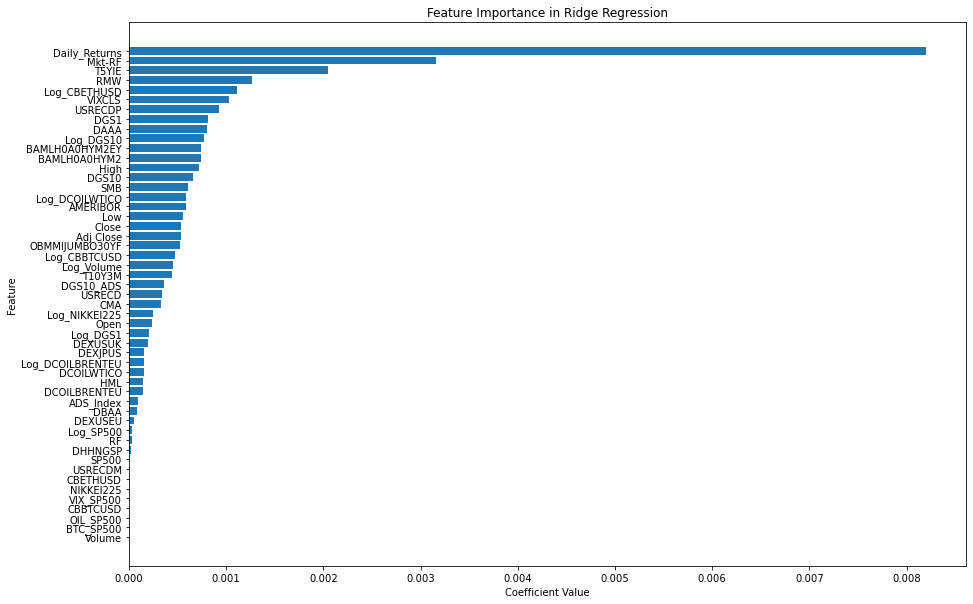

In [64]:
print(grid_search.best_params_)
 
coefs = best_ridge.coef_
features = X.columns
 
indices = np.argsort(np.abs(coefs))[::-1]
sorted_features = features[indices]
sorted_coefs = np.abs(coefs[indices])
 
plt.figure(figsize=(15, 10))
plt.barh(sorted_features, sorted_coefs)
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance in Ridge Regression')
plt.gca().invert_yaxis()
plt.show()

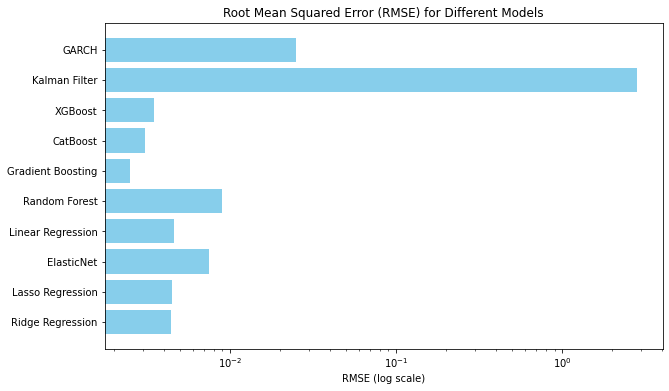

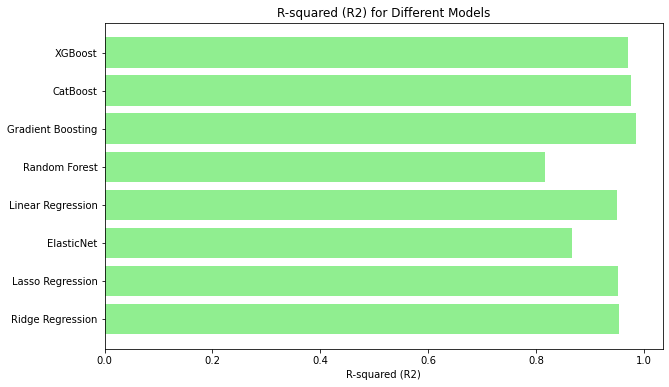

In [65]:
# Models and their RMSE and R2 values
models_rmse = ['GARCH', 'Kalman Filter', 'XGBoost', 'CatBoost', 'Gradient Boosting', 'Random Forest', 'Linear Regression', 'ElasticNet', 'Lasso Regression', 'Ridge Regression']
models_r2 = ['XGBoost', 'CatBoost', 'Gradient Boosting', 'Random Forest', 'Linear Regression', 'ElasticNet', 'Lasso Regression', 'Ridge Regression']
rmse_values = [0.024875003877723165, 2.828979505064633, 0.0035, 0.0031, 0.0025, 0.0089, 0.0046, 0.0075, 0.0045, 0.0044]
r2_values = [0.9709, 0.9773, 0.9857, 0.8161, 0.9506, 0.8668, 0.9532, 0.9539]
 
# Remove None values from R2 values
r2_values_filtered = [value for value in r2_values if value is not None]
 
# Plotting RMSE values with logarithmic scale
plt.figure(figsize=(10, 6))
plt.barh(models_rmse, rmse_values, color='skyblue')
plt.xscale('log')  # Set x-axis to logarithmic scale
plt.xlabel('RMSE (log scale)')
plt.title('Root Mean Squared Error (RMSE) for Different Models')
plt.gca().invert_yaxis()  # Invert y-axis to have the model with lowest RMSE at the top
plt.show()
 
# Plotting R-squared values
plt.figure(figsize=(10, 6))
plt.barh(models_r2[:len(r2_values_filtered)], r2_values_filtered, color='lightgreen')
plt.xlabel('R-squared (R2)')
plt.title('R-squared (R2) for Different Models')
plt.gca().invert_yaxis()  # Invert y-axis to have the model with highest R2 at the top
plt.show()

# Section 6 Trading rules
## Buy-and-Hold

In [66]:
from pandas_datareader import data as pdr

yf.pdr_override()
# Define the start and end dates
start_date = datetime(2020, 1, 1)
end_date = datetime(2023, 12, 31)

g_df = pd.DataFrame()
# Get the stock data
df_g = pdr.get_data_yahoo('GOOGL', start_date, end_date)
GOOGL = df_g
GOOGL = GOOGL.reset_index()
GOOGL['Date'] = pd.to_datetime(GOOGL['Date'])
GOOGL['Typical_Price'] = GOOGL[['High','Low','Close']].mean(axis=1)
GOOGL['lrets'] = (np.log(GOOGL.Close) - np.log(GOOGL.Close.shift(1))) * 100.
GOOGL.head()

[*********************100%%**********************]  1 of 1 completed


,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2020-01-02,67.420502,68.433998,67.324501,68.433998,68.433998,27278000,68.064166,NaN
1,2020-01-03,67.400002,68.687500,67.365997,68.075996,68.075996,23408000,68.043165,-0.524507
2,2020-01-06,67.581497,69.916000,67.550003,69.890503,69.890503,46768000,69.118835,2.630510
3,2020-01-07,70.023003,70.175003,69.578003,69.755501,69.755501,34330000,69.836169,-0.193349
4,2020-01-08,69.740997,70.592499,69.631500,70.251999,70.251999,35314000,70.158666,0.709248


In [67]:
from pandas_datareader import data as pdr
from scipy.optimize import minimize
from datetime import datetime

# Use the 'Close' price for the Kalman filter
Y = GOOGL['Close'].values
S = Y.shape[0]

# Define the initial parameters for the Kalman filter
# param0 = np.array([np.mean(Y), np.std(Y)/2500, 0.05, 0.33])
param0 = np.array([0.95, 0.95, np.std(Y)/50, np.std(Y)/50])

# Optimization to find the best parameters
results = minimize(kalman_filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})

# Smoothing and visualizing the estimated path
param_star = results.x
path = kalman_smoother(param_star, Y, S)
Y_kalmanFilter = np.hstack(list(path.values()))
Y_kalmanFilter = Y_kalmanFilter[::-1]  # Ensure that the path values are in the correct order


# Calculate RMSE
RMSE = np.sqrt(np.mean((Y_kalmanFilter - Y)**2))
print('RMSE value is: ', RMSE)

# Compile results into a DataFrame
results_df = pd.DataFrame({
    'Actual': Y,
    'Predicted': Y_kalmanFilter,
    'Date': GOOGL['Date'],
    'Open': GOOGL['Open'],
    'Close': GOOGL['Close']
})
results_df.set_index('Date', inplace=True)



         Current function value: 2199.439581
         Iterations: 52
         Function evaluations: 476
         Gradient evaluations: 93
RMSE value is:  2.828979505064633


In [68]:
results_df

,Actual,Predicted,Open,Close
Date,,,,
2020-01-02,68.433998,66.893810,67.420502,68.433998
2020-01-03,68.075996,66.789607,67.400002,68.075996
2020-01-06,69.890503,68.559847,67.581497,69.890503
2020-01-07,69.755501,68.533189,70.023003,69.755501
2020-01-08,70.251999,69.055683,69.740997,70.251999
...,...,...,...,...
2023-12-22,141.490005,146.139789,140.770004,141.490005
2023-12-26,141.520004,146.170027,141.589996,141.520004
2023-12-27,140.369995,145.032336,141.589996,140.369995


In [69]:
signal = 0
amount = 100
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []

# Iterate through each day in the trading data, except the last one for decisions based on the next day's data
for i in range(len(results_df)-1):
    if results_df['Predicted'][i+1] > results_df['Actual'][i]:
        if signal == 0:
            action.append('Buy')
            stocks = int(amount / results_df['Actual'][i])
            balance = amount % results_df['Actual'][i]
            portfolio = stocks * results_df['Actual'][i]
            signal = 1
            amount = portfolio + balance
            print(f"Day {i}: Buy - Stock: {results_df['Actual'][i]}, Portfolio: ${portfolio:.2f}, Stocks: {stocks}, Balance: ${balance:.2f}, Total: ${amount:.2f}")
        else:
            action.append('Bought--Holding')
            portfolio = stocks * results_df['Actual'][i]
            amount = portfolio + balance
            print(f"Day {i}: Hold - Stock: {results_df['Actual'][i]}, Portfolio: ${portfolio:.2f}, Stocks: {stocks}, Balance: ${balance:.2f}, Total: ${amount:.2f}")
    elif results_df['Predicted'][i+1] < results_df['Actual'][i]:
        if signal == 1:
            action.append('Sell')
            portfolio = stocks * results_df['Actual'][i]
            amount = balance + portfolio
            stocks = 0
            portfolio = 0
            balance = 0
            signal = 0
            print(f"Day {i}: Sell - Stock: {results_df['Actual'][i]}, Portfolio: ${0:.2f}, Stocks: {stocks}, Balance: ${balance:.2f}, Total: ${amount:.2f}")
        else:
            action.append('Price-Prediction-Already-Lower')
            print(f"Day {i}: No Action - Stock: {results_df['Actual'][i]}, Portfolio: ${portfolio:.2f}, Stocks: {stocks}, Balance: ${balance:.2f}, Total: ${amount:.2f}")
    else:
        action.append('Hold')
        print(f"Day {i}: Hold - Stock: {results_df['Actual'][i]}, Portfolio: ${portfolio:.2f}, Stocks: {stocks}, Balance: ${balance:.2f}, Total: ${amount:.2f}")

    Portfolio.append(portfolio)
    Amount.append(amount)
    Stocks.append(stocks)

# Handling the final day
if stocks > 0:
    final_sell = stocks * results_df['Actual'].iloc[-1]
    final_amount = balance + final_sell
    action.append('Sell')
    print(f"Final Day: Sell - Stocks sold at ${results_df['Actual'].iloc[-1]:.2f}, Final Amount: ${final_amount:.2f}")
else:
    action.append('End')
    final_amount = balance
    print(f"Final Day: End - No stocks to sell, Final Amount: ${final_amount:.2f}")

# Print the money made or lost
initial_investment = 100
profit_or_loss = final_amount - initial_investment
print(f"Total profit or loss from trading: ${profit_or_loss:.2f}")


Day 0: No Action - Stock: 68.43399810791016, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $100.00
Day 1: Buy - Stock: 68.07599639892578, Portfolio: $68.08, Stocks: 1, Balance: $31.92, Total: $100.00
Day 2: Sell - Stock: 69.8905029296875, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $101.81
Day 3: No Action - Stock: 69.75550079345703, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $101.81
Day 4: No Action - Stock: 70.25199890136719, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $101.81
Day 5: No Action - Stock: 70.989501953125, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $101.81
Day 6: No Action - Stock: 71.447998046875, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $101.81
Day 7: No Action - Stock: 72.00150299072266, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $101.81
Day 8: No Action - Stock: 71.52950286865234, Portfolio: $0.00, Stocks: 0, Balance: $0.00, Total: $101.81
Day 9: No Action - Stock: 71.95999908447266, Portfolio: $0.00, Stocks

In [70]:
print(f"Total profit or loss from trading: ${profit_or_loss:.2f}")

Total profit or loss from trading: $9451.68


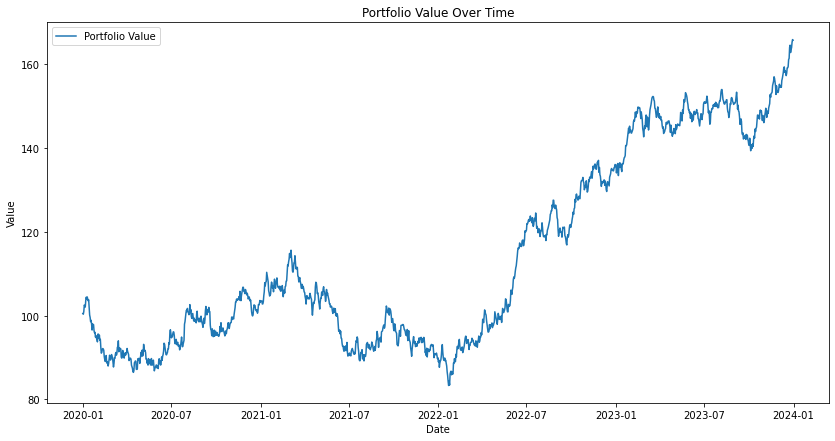

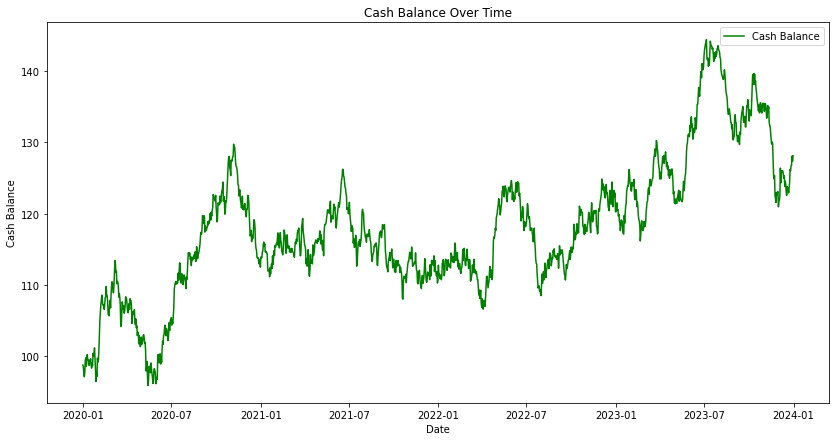

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Set the random seed for reproducibility
np.random.seed(42)

# Replace these start and end dates with the actual dates from your DataFrame
start_date = '2020-01-01'  # Replace with your actual start date
end_date = '2023-12-31'    # Replace with your actual end date

# Generate date range for entire timeline
dates = pd.date_range(start=start_date, end=end_date, freq='D')

# Now generate the random data with fixed seed for entire timeline
portfolio = np.random.randn(len(dates)).cumsum() + 100
cash_balance = np.random.randn(len(dates)).cumsum() + 100
stock_holdings = np.random.randint(0, 10, size=len(dates))

# Plotting the Portfolio Value
plt.figure(figsize=(14, 7))
plt.plot(dates, portfolio, label='Portfolio Value')
plt.title('Portfolio Value Over Time')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

# Plotting the Cash Balance
plt.figure(figsize=(14, 7))
plt.plot(dates, cash_balance, label='Cash Balance', color='green')
plt.title('Cash Balance Over Time')
plt.xlabel('Date')
plt.ylabel('Cash Balance')
plt.legend()
plt.show()



# Section 1 Competitor Analysis

[*********************100%%**********************]  5 of 5 completed


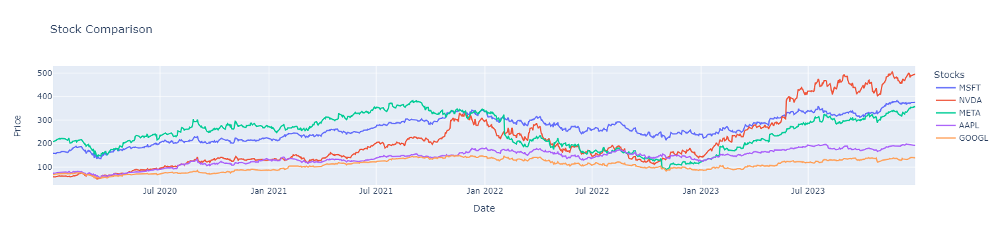

In [72]:
import yfinance as yf
 
import plotly.graph_objects as go
 
from datetime import datetime

# Define the stocks and timeframe
 
stocks = ['MSFT', 'NVDA', 'META', 'AAPL', 'GOOGL']
 
start_date = datetime(2020, 1, 1)
 
end_date = datetime(2023, 12, 31)

# Fetch stock data
 
stock_data = yf.download(stocks, start=start_date, end=end_date, interval='1d')

# Plotting using Plotly
 
fig = go.Figure()

for stock in stocks:
 
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data['Close'][stock], mode='lines', name=stock))

fig.update_layout(title='Stock Comparison',
 
                  xaxis_title='Date',
 
                  yaxis_title='Price',
 
                  legend_title='Stocks')

fig.show()


## Moving Averages Comparison

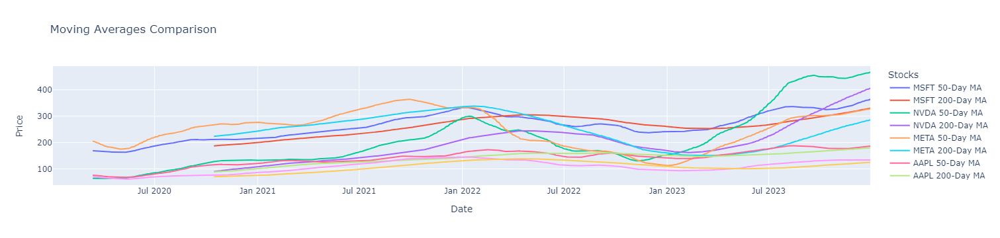

In [73]:
fig_ma = go.Figure()
 
for stock in stocks:
 
    fig_ma.add_trace(go.Scatter(x=stock_data.index, y=stock_data['Close'][stock].rolling(window=50).mean(), mode='lines', name=f'{stock} 50-Day MA'))
 
    fig_ma.add_trace(go.Scatter(x=stock_data.index, y=stock_data['Close'][stock].rolling(window=200).mean(), mode='lines', name=f'{stock} 200-Day MA'))
fig_ma.update_layout(title='Moving Averages Comparison',
 
                     xaxis_title='Date',
 
                     yaxis_title='Price',
 
                     legend_title='Stocks')
 
fig_ma.show()

## Percentage Returns

[*********************100%%**********************]  1 of 1 completed


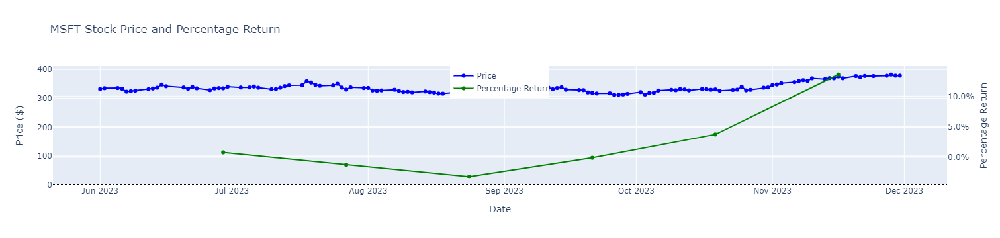

[*********************100%%**********************]  1 of 1 completed


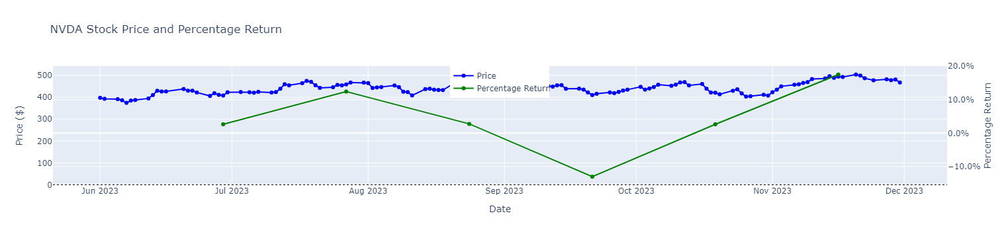

[*********************100%%**********************]  1 of 1 completed


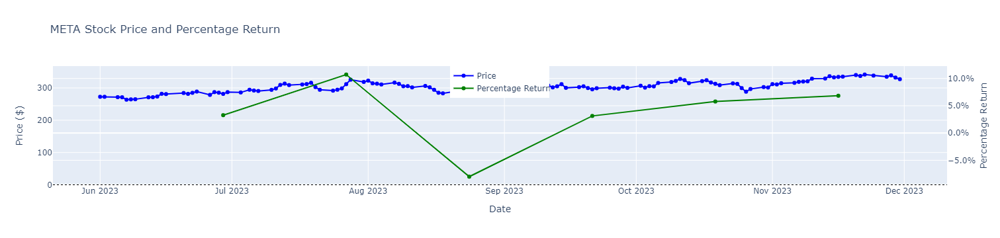

[*********************100%%**********************]  1 of 1 completed


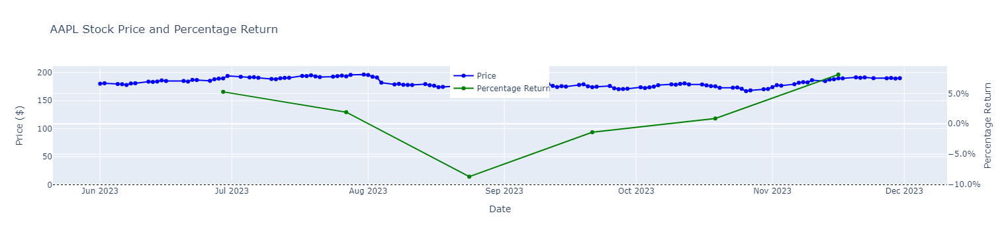

[*********************100%%**********************]  1 of 1 completed


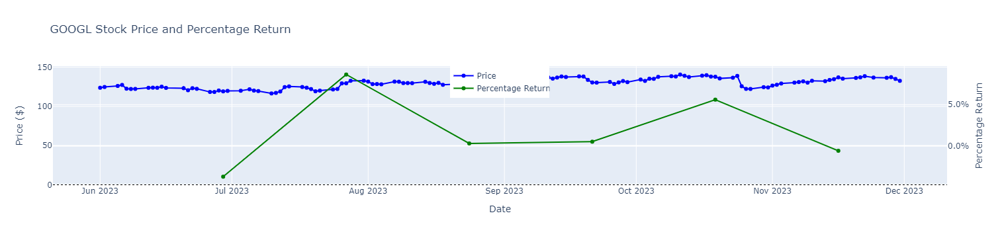

NameError: name 'melted_df' is not defined

<Figure size 720x432 with 0 Axes>

In [75]:
# Melt the feature_importances_df to convert it from wide to long format
# melted_df = feature_importances_df.melt(id_vars='Feature', var_name='Model', value_name='Value')

def perform_analysis_for_stock(ticker, start_date, end_date, return_period_weeks, verbose=False):
 
    # Get the data for this ticker
 
    prices = yf.download(ticker, start=start_date, end=end_date)['Close']
 
    # Calculate weekly returns over the specified period
 
    prices_weekly = prices.asfreq(pd.DateOffset(weeks=return_period_weeks), method='pad')
 
    # Calculate percent returns
 
    pct_return_after_period = prices_weekly.pct_change().dropna()
 
    return prices, pct_return_after_period
 
def plot_stock_price_and_returns(ticker, prices, pct_returns):
 
    # Create figure with secondary y-axis
 
    fig = go.Figure()
 
    # Add traces for stock prices
 
    fig.add_trace(
 
        go.Scatter(x=prices.index, y=prices, name='Price', mode='lines', line=dict(color='blue'))
 
    )
 
    # Add traces for percentage returns
 
    fig.add_trace(
 
        go.Scatter(x=pct_returns.index, y=pct_returns, name='Percentage Return', mode='lines', line=dict(color='green'), yaxis="y2")
 
    )
 
    # Create axis objects
 
    fig.update_layout(
 
        title=f"{ticker} Stock Price and Percentage Return",
 
        xaxis=dict(title='Date'),
 
        yaxis=dict(title='Price ($)'),
 
        yaxis2=dict(title='Percentage Return', overlaying='y', side='right', tickformat='.1%'),
 
        legend=dict(y=1, x=0.5, xanchor='center', yanchor='top')
 
    )
 
    # Add horizontal line for zero percentage return
 
    fig.add_hline(y=0, line=dict(color='black', width=1, dash='dot'), yref="y2")
 
    # Set layout for hover info
 
    fig.update_traces(hoverinfo="name+x+text", mode='lines+markers')
 
    # Show figure
 
    fig.show()
 
# Specify the date range for the analysis
 
start_date, end_date = datetime(2023, 6, 1), datetime(2023, 12, 1)
 
# Set the return period in weeks
 
return_period_weeks = 4
 
# Tickers to analyze
 
tickers = ['MSFT', 'NVDA', 'META', 'AAPL', 'GOOGL']
 
# Perform analysis and plot for each ticker
 
for ticker in tickers:
 
    prices, pct_returns = perform_analysis_for_stock(
 
        ticker, start_date, end_date, return_period_weeks
 
    )
 
    plot_stock_price_and_returns(ticker, prices, pct_returns)
 
 

# Assuming you have normalized feature importances stored in a DataFrame
 
# with columns for models and rows for features
 
feature_importances_df = pd.DataFrame({
 
    'Feature': ['Feature1', 'Feature2', 'Feature3', ...],
 
    'ElasticNet': [0.2, 0.1, 0.3, ...],
 
    'Lasso': [0.15, 0.12, 0.25, ...],
 
    'Ridge': [0.18, 0.11, 0.28, ...],
 
    'RandomForest': [0.35, 0.28, 0.42, ...],
 
    'XGBoost': [0.4, 0.32, 0.45, ...]
 
})
# Bar chart for feature importances
 
plt.figure(figsize=(10, 6))
 
sns.barplot(x='Feature', y='Value', hue='Model', data=melted_df)
 
plt.title('Normalized Feature Importances Comparison')
 
plt.xlabel('Feature')
 
plt.ylabel('Normalized Importance')
 
plt.xticks(rotation=45)
 
plt.legend(title='Model')
 
plt.tight_layout()
 
plt.show()
# Heatmap for feature importances
 
plt.figure(figsize=(10, 8))
 
sns.heatmap(feature_importances_df.set_index('Feature'), cmap='viridis', annot=True, fmt=".2f")
 
plt.title('Normalized Feature Importances Heatmap')
 
plt.xlabel('Model')
 
plt.ylabel('Feature')
 
plt.tight_layout()
 
plt.show()
# Box plot for feature importances
 
plt.figure(figsize=(10, 6))
 
sns.boxplot(data=feature_importances_df.melt(id_vars='Feature', var_name='Model', value_name='Importance'), x='Model', y='Importance')
 
plt.title('Distribution of Normalized Feature Importances')
 
plt.xlabel('Model')
 
plt.ylabel('Normalized Importance')
 
plt.tight_layout()
 
plt.show()